### Name: Shubham Sankpal
### Email: shubhamsankpal4@gmail.com

### Project Motivation

The aim of this project was to create the base models of all the machine learning algorithms that are frequently used in a classification problem statement and store the results in CSV or JSON format for further analysis problem. There was a similar use case like this classification problem and the company where I am working wanted me to create these base models. 

This jupyter notebook demonstrates the data analysis, insight building, feature selection, model development and model tuning. Also, the reasoning of every step is given so that everyone can understand the process. 

### About the dataset 

- Steel plate fault dataset comes from research by Semeion, Research Center of Sciences of Communication. 

- The dataset consists of 27 independent features causing different types of steel plate fault.

- The original aim of the project was to correctly classify the type of surface defects in stainless steel plates, with six types of possible defects plus "other" and so overall 7 classes.


### Methodology

#### 1. Data Exploration:
- Reading Initial dataset
- Initial data description
- Correlation Analysis
- Feature Selection
- Feature Engineering

#### 2. Model Development:

- Model developmet
- Model Tuning
- Model Evaluation

#### 3. Model Comparison:
- Model explanation
- Model Evaluation
- Prediction

#### 4. Summary of Analysis and Conclusion

### Importing Libraries

In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### Reading Dataset 

In [2]:
#Fetching the dataset
import openml
dataset = openml.datasets.get_dataset(40982)
dataset

OpenML Dataset
Name..........: steel-plates-fault
Version.......: 3
Format........: ARFF
Upload Date...: 2017-12-04 22:37:56
Licence.......: Public
Download URL..: https://www.openml.org/data/v1/download/18151921/steel-plates-fault.arff
OpenML URL....: https://www.openml.org/d/40982
# of features.: 28
# of instances: 1941

### Data Explorartion

In [3]:
#Reading the data and converting it into dataframe
data, target, categorical_indicator, attribute_names = dataset.get_data(dataset_format="dataframe", target=dataset.default_target_attribute)

In [4]:
data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27
0,42.0,50.0,270900.0,270944.0,267.0,17.0,44.0,24220.0,76.0,108.0,...,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822
1,645.0,651.0,2538079.0,2538108.0,108.0,10.0,30.0,11397.0,84.0,123.0,...,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984
2,829.0,835.0,1553913.0,1553931.0,71.0,8.0,19.0,7972.0,99.0,125.0,...,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150
3,853.0,860.0,369370.0,369415.0,176.0,13.0,45.0,18996.0,99.0,126.0,...,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212
4,1289.0,1306.0,498078.0,498335.0,2409.0,60.0,260.0,246930.0,37.0,126.0,...,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936,249.0,277.0,325780.0,325796.0,273.0,54.0,22.0,35033.0,119.0,141.0,...,0.0206,0.5185,0.7273,0.0,2.4362,1.4472,1.2041,-0.4286,0.0026,0.7254
1937,144.0,175.0,340581.0,340598.0,287.0,44.0,24.0,34599.0,112.0,133.0,...,0.0228,0.7046,0.7083,0.0,2.4579,1.4914,1.2305,-0.4516,-0.0582,0.8173
1938,145.0,174.0,386779.0,386794.0,292.0,40.0,22.0,37572.0,120.0,140.0,...,0.0213,0.7250,0.6818,0.0,2.4654,1.4624,1.1761,-0.4828,0.0052,0.7079
1939,137.0,170.0,422497.0,422528.0,419.0,97.0,47.0,52715.0,117.0,140.0,...,0.0243,0.3402,0.6596,0.0,2.6222,1.5185,1.4914,-0.0606,-0.0171,0.9919


In [5]:
target

0             Pastry
1             Pastry
2             Pastry
3             Pastry
4             Pastry
            ...     
1936    Other_Faults
1937    Other_Faults
1938    Other_Faults
1939    Other_Faults
1940    Other_Faults
Name: target, Length: 1941, dtype: category
Categories (7, object): [Bumps < Dirtiness < K_Scratch < Other_Faults < Pastry < Stains < Z_Scratch]

As discussed earlier the dataset is having 27 independent variable that are stored in dataframe 'data' and traget is our dependent feature that contains the type of steel plate fault.

As we can see data does not have labels and so it might be confusing for us to understand the features. So from the dataset documenation I have taken all the lables with respect to each feature.

In [6]:
# Adding the labels to dataset for better understanding the features

data = data.rename(columns={ 'V1': 'X_Minimum', 'V2': 'X_Maximum', 'V3': 'Y_Minimum', 'V4': 'Y_Maximum','V5': 'Pixels_Areas',
'V6': 'X_Perimeter',
'V7': 'Y_Perimeter',
'V8': 'Sum_of_Luminosity',
'V9': 'Minimum_of_Luminosity',
'V10': 'Maximum_of_Luminosity',
'V11': 'Length_of_Conveyer',
'V12': 'TypeOfSteel_A300',
'V13': 'TypeOfSteel_A400',
'V14': 'Steel_Plate_Thickness',
'V15': 'Edges_Index',
'V16': 'Empty_Index',
'V17': 'Square_Index',
'V18': 'Outside_X_Index',
'V19': 'Edges_X_Index',
'V20': 'Edges_Y_Index',
'V21': 'Outside_Global_Index',
'V22': 'LogOfAreas',
'V23': 'Log_X_Index',
'V24': 'Log_Y_Index',
'V25': 'Orientation_Index',
'V26':'Luminosity_Index',
'V27': 'SigmoidOfAreas'})

In [7]:
#Checking for the null values in the dataset
data.isnull().sum()

X_Minimum                0
X_Maximum                0
Y_Minimum                0
Y_Maximum                0
Pixels_Areas             0
X_Perimeter              0
Y_Perimeter              0
Sum_of_Luminosity        0
Minimum_of_Luminosity    0
Maximum_of_Luminosity    0
Length_of_Conveyer       0
TypeOfSteel_A300         0
TypeOfSteel_A400         0
Steel_Plate_Thickness    0
Edges_Index              0
Empty_Index              0
Square_Index             0
Outside_X_Index          0
Edges_X_Index            0
Edges_Y_Index            0
Outside_Global_Index     0
LogOfAreas               0
Log_X_Index              0
Log_Y_Index              0
Orientation_Index        0
Luminosity_Index         0
SigmoidOfAreas           0
dtype: int64

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1941 entries, 0 to 1940
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   X_Minimum              1941 non-null   float64
 1   X_Maximum              1941 non-null   float64
 2   Y_Minimum              1941 non-null   float64
 3   Y_Maximum              1941 non-null   float64
 4   Pixels_Areas           1941 non-null   float64
 5   X_Perimeter            1941 non-null   float64
 6   Y_Perimeter            1941 non-null   float64
 7   Sum_of_Luminosity      1941 non-null   float64
 8   Minimum_of_Luminosity  1941 non-null   float64
 9   Maximum_of_Luminosity  1941 non-null   float64
 10  Length_of_Conveyer     1941 non-null   float64
 11  TypeOfSteel_A300       1941 non-null   float64
 12  TypeOfSteel_A400       1941 non-null   float64
 13  Steel_Plate_Thickness  1941 non-null   float64
 14  Edges_Index            1941 non-null   float64
 15  Empt

The dataset contains total 1941 entries in total and all the feature belongs to data type 'Float'

In [9]:
target.value_counts()

Other_Faults    673
Bumps           402
K_Scratch       391
Z_Scratch       190
Pastry          158
Stains           72
Dirtiness        55
Name: target, dtype: int64

In [10]:
target.unique()

[Pastry, Z_Scratch, K_Scratch, Stains, Dirtiness, Bumps, Other_Faults]
Categories (7, object): [Bumps < Dirtiness < K_Scratch < Other_Faults < Pastry < Stains < Z_Scratch]

- As it can be seen that our target variable has total 7 different types of steel fault.
- Looking at the value counts of target variablewe can say that the dataset is imbalanced as the ratio does not match amongst the classes. This problem can be solved using under sampling and over sampling methods. Also by using repeated startified K-Fold we can handle this issue as reapeated stratified K- fold method keep the ratio of each class equal in every repeation.

In [11]:
data.describe()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
count,1941.000000,1941.000000,1.941000e+03,1.941000e+03,1941.000000,1941.000000,1941.000000,1.941000e+03,1941.000000,1941.000000,...,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000
mean,571.136012,617.964451,1.650685e+06,1.650739e+06,1893.878413,111.855229,82.965997,2.063121e+05,84.548686,130.193715,...,0.033361,0.610529,0.813472,0.575734,2.492388,1.335686,1.403271,0.083288,-0.131305,0.585420
std,520.690671,497.627410,1.774578e+06,1.774590e+06,5168.459560,301.209187,426.482879,5.122936e+05,32.134276,18.690992,...,0.058961,0.243277,0.234274,0.482352,0.788930,0.481612,0.454345,0.500868,0.148767,0.339452
min,0.000000,4.000000,6.712000e+03,6.724000e+03,2.000000,2.000000,1.000000,2.500000e+02,0.000000,37.000000,...,0.001500,0.014400,0.048400,0.000000,0.301000,0.301000,0.000000,-0.991000,-0.998900,0.119000
25%,51.000000,192.000000,4.712530e+05,4.712810e+05,84.000000,15.000000,13.000000,9.522000e+03,63.000000,124.000000,...,0.006600,0.411800,0.596800,0.000000,1.924300,1.000000,1.079200,-0.333300,-0.195000,0.248200
50%,435.000000,467.000000,1.204128e+06,1.204136e+06,174.000000,26.000000,25.000000,1.920200e+04,90.000000,127.000000,...,0.010100,0.636400,0.947400,1.000000,2.240600,1.176100,1.322200,0.095200,-0.133000,0.506300
75%,1053.000000,1072.000000,2.183073e+06,2.183084e+06,822.000000,84.000000,83.000000,8.301100e+04,106.000000,140.000000,...,0.023500,0.800000,1.000000,1.000000,2.914900,1.518500,1.732400,0.511600,-0.066600,0.999800
max,1705.000000,1713.000000,1.298766e+07,1.298769e+07,152655.000000,10449.000000,18152.000000,1.159141e+07,203.000000,253.000000,...,0.875900,1.000000,1.000000,1.000000,5.183700,3.074100,4.258700,0.991700,0.642100,1.000000


In [12]:
data.skew(axis = 0, skipna = True) 

X_Minimum                 0.500897
X_Maximum                 0.524210
Y_Minimum                 2.811213
Y_Maximum                 2.811169
Pixels_Areas             14.083822
X_Perimeter              21.539451
Y_Perimeter              39.293158
Sum_of_Luminosity         7.730720
Minimum_of_Luminosity    -0.107098
Maximum_of_Luminosity     1.287035
Length_of_Conveyer        0.851422
TypeOfSteel_A300          0.407249
TypeOfSteel_A400         -0.407249
Steel_Plate_Thickness     2.206935
Edges_Index               0.685771
Empty_Index               0.293468
Square_Index             -0.056306
Outside_X_Index           5.181830
Edges_X_Index            -0.235096
Edges_Y_Index            -0.928582
Outside_Global_Index     -0.306422
LogOfAreas                0.748284
Log_X_Index               1.001014
Log_Y_Index               0.445101
Orientation_Index        -0.153446
Luminosity_Index          0.679339
SigmoidOfAreas            0.125789
dtype: float64

### Initial data description

- The data consists of 1941 entries and 27 independent variable out of which all the 27 are numeric with most of them having decimal value with precision 1.
- The target variable has 7 classes namely Bumps, Dirtiness, K_Scratch, Other_Faults, Pastry, Stains, Z_Scratch
- By looking at the skewness of the data we can draw the following information:
    - Feature Minimum_of_Luminosity, TypeOfSteel_A400, Edges_X_Index, Edges_Y_Index, Outside_Global_Index, Outside_Global_Index and Orientation_Index are left skewed or negatively skewed as the value is a bit far from 0. 
    - Rest all features are positively skewed with Pixels_Areas, X_Perimeter, Y_Perimeter widely skewed to right by skewness level > 10.
    - According to Wikipedia, ”In probability theory and statistics, skewness is a measure of the asymmetry of the probability distribution of a real-valued random variable about its mean.”
    - Usually, |skewness| < 1 would have a normal-like distribution shape. Next, we will explore further using Hmisc package for detailed data summary.
    
- Next, we will plot the histogram and a pariplot to visualise the distribution and examine their skewness. According to Ötüken (2013) on his paper "Impact of Skewness on Statistical Power", if we are willing to apply nonparametric tests on the data obtained from two samples, the samples having skewness coefficient of 0.75 may reach a greater statistical power.

- Hence, we will use this value to determine whether the distribution is classified as normal or skewed. 

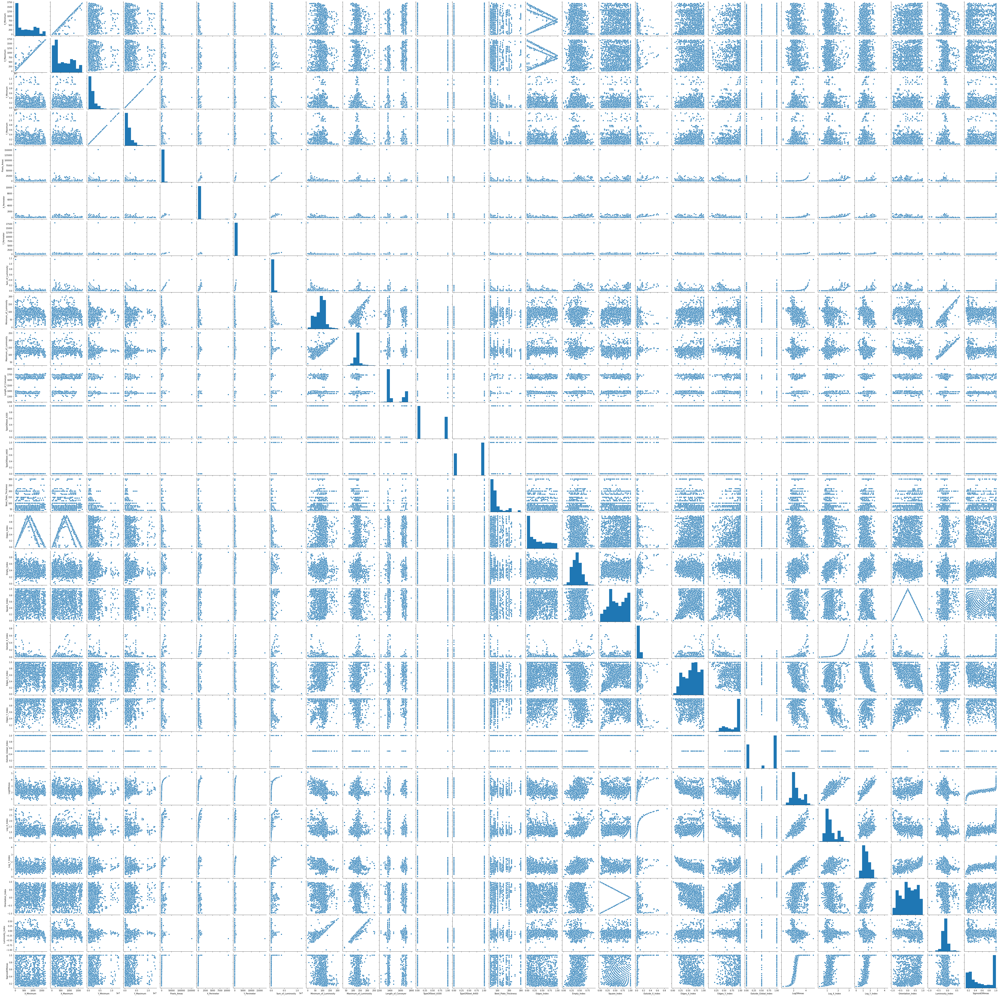

In [14]:
sns.pairplot(data)

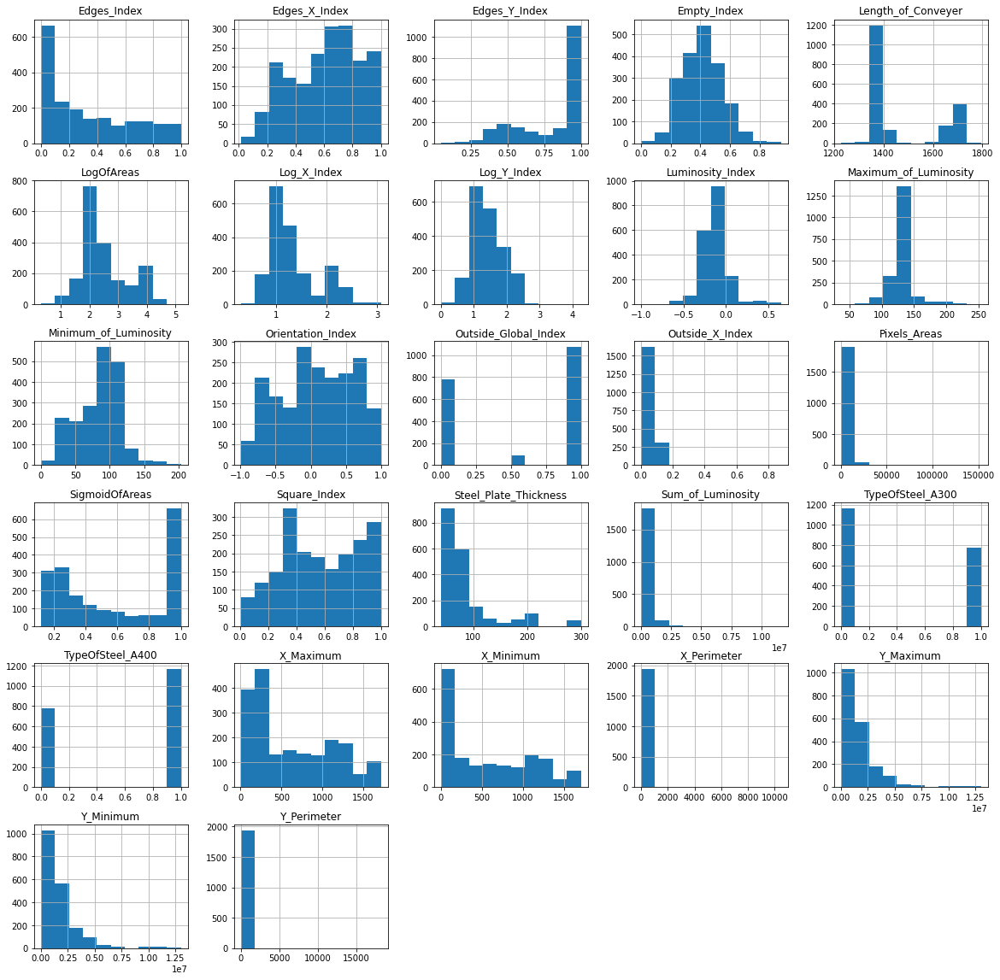

In [13]:
# Plotting the histograms
data.hist(figsize=(20,20))
plt.show()


<table align="center" style="width:850px;border: 1px solid #ddd">
    <tr style="background-color:#3277a8;color:white;font-size:12px">
        <th style="width:150px;border: 1px solid #ddd;text-align:center">Normally Distributed</th>
        <th style="width:150px;border: 1px solid #ddd;text-align:center">Right Skewed</th>
        <th style="width:150px;border: 1px solid #ddd;text-align:center">Left Skewed</th>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Edges_X_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Edges_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Edges_Y_Index</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Empty_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Lenght_of_Conveyer</td>
        <td style="border: 1px solid #ddd;text-align:center">Outside_Global_Index</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">LogOfAreas</td>
        <td style="border: 1px solid #ddd;text-align:center">Outside_X_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">TypeOfSteel_A400</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Log_X_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Pixel_Axes</td>
        <td style="border: 1px solid #ddd;text-align:center">Sigmoid_Of_Areas</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Log_Y_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Steel_Plate_Thickness</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Luminosity_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">Sum_of_Luminosity</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Maximum_of_Luminosity</td>
        <td style="border: 1px solid #ddd;text-align:center">TyeOfSteel_A300</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Minimum_of_Luminosity</td>
        <td style="border: 1px solid #ddd;text-align:center">X_Maximum</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Orientation_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">X_Minimum</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">Square_Index</td>
        <td style="border: 1px solid #ddd;text-align:center">X_Perimeter</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center"></td>
        <td style="border: 1px solid #ddd;text-align:center">Y_Perimeter</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center"></td>
        <td style="border: 1px solid #ddd;text-align:center">Y_Maximum</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center"></td>
        <td style="border: 1px solid #ddd;text-align:center">Y_Minimum</td>
        <td style="border: 1px solid #ddd;text-align:center"></td>
    </tr>

- The skewness in the features are visible by the distribution of most of the features.
- From the above table we can understand the type of distriution related to each feature and can use different type of tranformation techniques in order to get the data normally distributes.
- Techniques like:
    - Log tranfromation
    - Square root tranfromation
    - BoxCox tranfromation
    - Reciprocal Tranfromation
    
- We are not tranforming the data right now. As we have to create the base model and check how the data performs and if the accuracy of model seems to be less we can use these tranfromation techniques.

### Correaltion Analysis

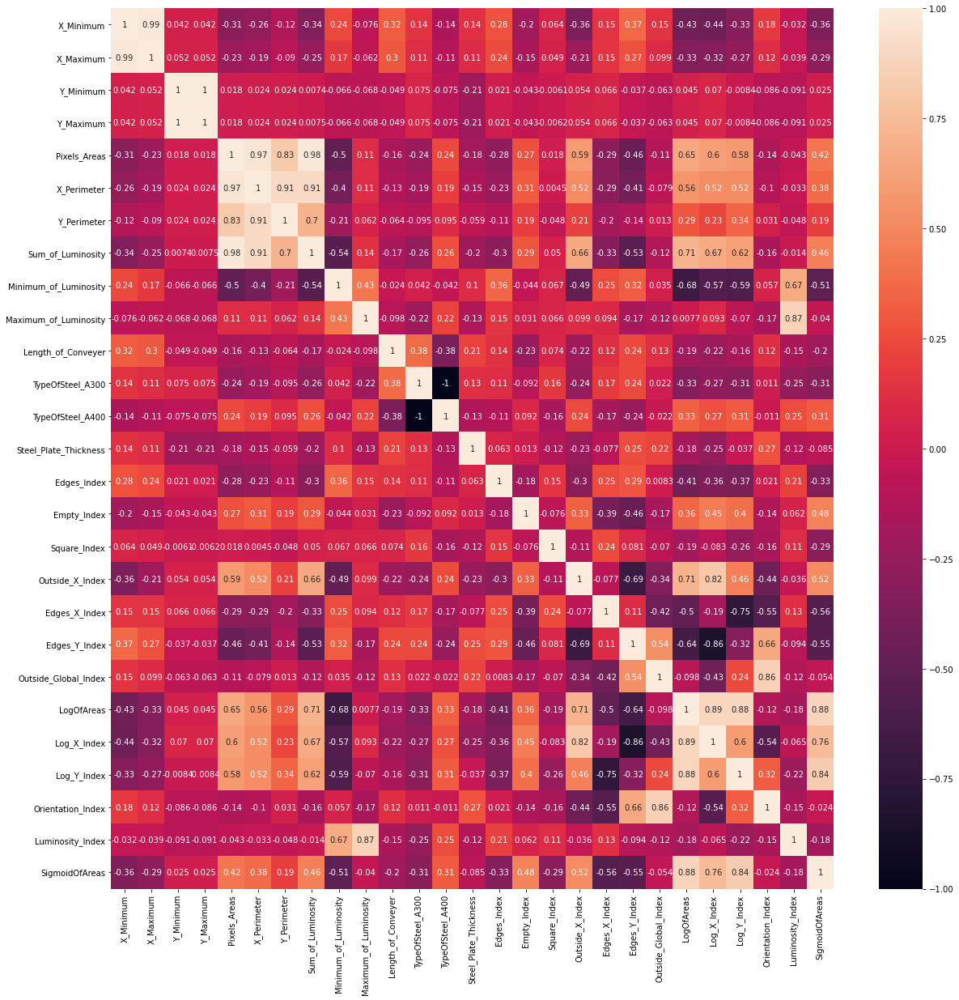

In [15]:
import seaborn as sns
corr= data.corr()
top_features=corr.index
plt.figure(figsize=(20,20))
sns.heatmap(data[top_features].corr(),annot=True)

In [16]:
data.corr()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
X_Minimum,1.000000,0.988314,0.041821,0.041807,-0.307322,-0.258937,-0.118757,-0.339045,0.237637,-0.075554,...,-0.361160,0.154778,0.367907,0.147282,-0.428553,-0.437944,-0.326851,0.178585,-0.031578,-0.355251
X_Maximum,0.988314,1.000000,0.052147,0.052135,-0.225399,-0.186326,-0.090138,-0.247052,0.168649,-0.062392,...,-0.214930,0.149259,0.271915,0.099253,-0.332169,-0.324012,-0.265990,0.115019,-0.038996,-0.286736
Y_Minimum,0.041821,0.052147,1.000000,1.000000,0.017670,0.023843,0.024150,0.007362,-0.065703,-0.067785,...,0.054165,0.066085,-0.036543,-0.062911,0.044952,0.070406,-0.008442,-0.086497,-0.090654,0.025257
Y_Maximum,0.041807,0.052135,1.000000,1.000000,0.017840,0.024038,0.024380,0.007499,-0.065733,-0.067776,...,0.054185,0.066051,-0.036549,-0.062901,0.044994,0.070432,-0.008382,-0.086480,-0.090666,0.025284
Pixels_Areas,-0.307322,-0.225399,0.017670,0.017840,1.000000,0.966644,0.827199,0.978952,-0.497204,0.110063,...,0.588606,-0.294673,-0.463571,-0.109655,0.650234,0.603072,0.578342,-0.137604,-0.043449,0.422947
X_Perimeter,-0.258937,-0.186326,0.023843,0.024038,0.966644,1.000000,0.912436,0.912956,-0.400427,0.111363,...,0.517098,-0.293039,-0.412100,-0.079106,0.563036,0.524716,0.523472,-0.101731,-0.032617,0.380605
Y_Perimeter,-0.118757,-0.090138,0.024150,0.024380,0.827199,0.912436,1.000000,0.704876,-0.213758,0.061809,...,0.209160,-0.195162,-0.136723,0.013438,0.294040,0.228485,0.344378,0.031381,-0.047778,0.191772
Sum_of_Luminosity,-0.339045,-0.247052,0.007362,0.007499,0.978952,0.912956,0.704876,1.000000,-0.540566,0.136515,...,0.658339,-0.327728,-0.529745,-0.121090,0.712128,0.667736,0.618795,-0.158483,-0.014067,0.464248
Minimum_of_Luminosity,0.237637,0.168649,-0.065703,-0.065733,-0.497204,-0.400427,-0.213758,-0.540566,1.000000,0.429605,...,-0.487574,0.252256,0.316610,0.035462,-0.678762,-0.567655,-0.588208,0.057123,0.669534,-0.514797
Maximum_of_Luminosity,-0.075554,-0.062392,-0.067785,-0.067776,0.110063,0.111363,0.061809,0.136515,0.429605,1.000000,...,0.099300,0.093522,-0.167441,-0.124039,0.007672,0.092823,-0.069522,-0.169747,0.870160,-0.039651


- From the above correlation heatmap we can be able to figure which features are highly correlated to each other.
- Here we are able to see X_Maximum anf X_Minimum are highly correlated with upto value 0.98.
- Pixel_Area and X_Perimeter along with X_Perimeter and Y_perimeter have high correlation value.
- Outisde_Global_Index and X_Maximum are most correlated features with upto value 0.99.

Feature selection based on correlated features can be done in order to reduce model complexity and decrease the model training time. How the hghly correlated features can be removed is shown in the later stage.

### Label Encoding the target 

In [17]:
# Encoding the target variable
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data['encoded target'] = le.fit_transform(target.values)

In [18]:
data

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,encoded target
0,42.0,50.0,270900.0,270944.0,267.0,17.0,44.0,24220.0,76.0,108.0,...,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,4
1,645.0,651.0,2538079.0,2538108.0,108.0,10.0,30.0,11397.0,84.0,123.0,...,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,4
2,829.0,835.0,1553913.0,1553931.0,71.0,8.0,19.0,7972.0,99.0,125.0,...,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,4
3,853.0,860.0,369370.0,369415.0,176.0,13.0,45.0,18996.0,99.0,126.0,...,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,4
4,1289.0,1306.0,498078.0,498335.0,2409.0,60.0,260.0,246930.0,37.0,126.0,...,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936,249.0,277.0,325780.0,325796.0,273.0,54.0,22.0,35033.0,119.0,141.0,...,0.5185,0.7273,0.0,2.4362,1.4472,1.2041,-0.4286,0.0026,0.7254,3
1937,144.0,175.0,340581.0,340598.0,287.0,44.0,24.0,34599.0,112.0,133.0,...,0.7046,0.7083,0.0,2.4579,1.4914,1.2305,-0.4516,-0.0582,0.8173,3
1938,145.0,174.0,386779.0,386794.0,292.0,40.0,22.0,37572.0,120.0,140.0,...,0.7250,0.6818,0.0,2.4654,1.4624,1.1761,-0.4828,0.0052,0.7079,3
1939,137.0,170.0,422497.0,422528.0,419.0,97.0,47.0,52715.0,117.0,140.0,...,0.3402,0.6596,0.0,2.6222,1.5185,1.4914,-0.0606,-0.0171,0.9919,3


In [19]:
y = data['encoded target']

In [20]:
data['encoded target'].unique()

array([4, 6, 2, 5, 1, 0, 3])

In [21]:
X = data.iloc[:,:-1]
X

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,42.0,50.0,270900.0,270944.0,267.0,17.0,44.0,24220.0,76.0,108.0,...,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822
1,645.0,651.0,2538079.0,2538108.0,108.0,10.0,30.0,11397.0,84.0,123.0,...,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984
2,829.0,835.0,1553913.0,1553931.0,71.0,8.0,19.0,7972.0,99.0,125.0,...,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150
3,853.0,860.0,369370.0,369415.0,176.0,13.0,45.0,18996.0,99.0,126.0,...,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212
4,1289.0,1306.0,498078.0,498335.0,2409.0,60.0,260.0,246930.0,37.0,126.0,...,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936,249.0,277.0,325780.0,325796.0,273.0,54.0,22.0,35033.0,119.0,141.0,...,0.0206,0.5185,0.7273,0.0,2.4362,1.4472,1.2041,-0.4286,0.0026,0.7254
1937,144.0,175.0,340581.0,340598.0,287.0,44.0,24.0,34599.0,112.0,133.0,...,0.0228,0.7046,0.7083,0.0,2.4579,1.4914,1.2305,-0.4516,-0.0582,0.8173
1938,145.0,174.0,386779.0,386794.0,292.0,40.0,22.0,37572.0,120.0,140.0,...,0.0213,0.7250,0.6818,0.0,2.4654,1.4624,1.1761,-0.4828,0.0052,0.7079
1939,137.0,170.0,422497.0,422528.0,419.0,97.0,47.0,52715.0,117.0,140.0,...,0.0243,0.3402,0.6596,0.0,2.6222,1.5185,1.4914,-0.0606,-0.0171,0.9919


### Feature Selection

The Below section focuses on feature selection based on 3 methods that are generally used:
- Feature Importance
- Information gain (multi_info_classif_)
- Removing Multicollinear features

The results if taken in account can help in reducing the number of input vatriables. We can decide how many fearures to take moving forward with model traning based on their impoetace value. 

#### a. Feature Importance

In this we are using Extra Tree Classifier. This class implements a meta estimator that fits a number of
randomized decision trees (a.k.a. extra-trees) on various sub-samples
of the dataset and uses averaging to improve the predictive accuracy
and control over-fitting.

In [22]:
from sklearn.ensemble import ExtraTreesClassifier
y.shape, X.shape
model=ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [23]:
X

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,42.0,50.0,270900.0,270944.0,267.0,17.0,44.0,24220.0,76.0,108.0,...,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822
1,645.0,651.0,2538079.0,2538108.0,108.0,10.0,30.0,11397.0,84.0,123.0,...,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984
2,829.0,835.0,1553913.0,1553931.0,71.0,8.0,19.0,7972.0,99.0,125.0,...,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150
3,853.0,860.0,369370.0,369415.0,176.0,13.0,45.0,18996.0,99.0,126.0,...,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212
4,1289.0,1306.0,498078.0,498335.0,2409.0,60.0,260.0,246930.0,37.0,126.0,...,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936,249.0,277.0,325780.0,325796.0,273.0,54.0,22.0,35033.0,119.0,141.0,...,0.0206,0.5185,0.7273,0.0,2.4362,1.4472,1.2041,-0.4286,0.0026,0.7254
1937,144.0,175.0,340581.0,340598.0,287.0,44.0,24.0,34599.0,112.0,133.0,...,0.0228,0.7046,0.7083,0.0,2.4579,1.4914,1.2305,-0.4516,-0.0582,0.8173
1938,145.0,174.0,386779.0,386794.0,292.0,40.0,22.0,37572.0,120.0,140.0,...,0.0213,0.7250,0.6818,0.0,2.4654,1.4624,1.1761,-0.4828,0.0052,0.7079
1939,137.0,170.0,422497.0,422528.0,419.0,97.0,47.0,52715.0,117.0,140.0,...,0.0243,0.3402,0.6596,0.0,2.6222,1.5185,1.4914,-0.0606,-0.0171,0.9919


In [24]:
print(model.feature_importances_)

[0.05015355 0.04312448 0.03296944 0.03360193 0.02510895 0.02386195
 0.02276072 0.03650109 0.03501828 0.03089953 0.06844815 0.03245991
 0.03385027 0.06599592 0.03771028 0.02656069 0.03162091 0.03890577
 0.02790704 0.05085745 0.01696406 0.05176743 0.0464211  0.03031108
 0.03868379 0.02973008 0.03780613]


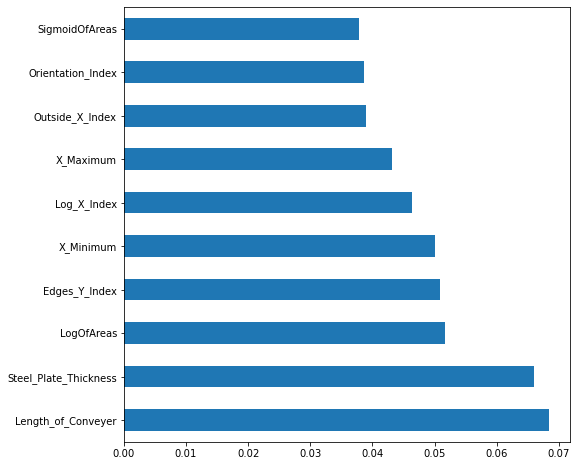

In [25]:
ranked_features=pd.Series(model.feature_importances_,index=X.columns)
ranked_features.nlargest(10).plot(kind='barh',figsize = (8,8))
plt.show()

We can select this top 10 features in order to reduce model complexity but here as all the features has importance score quite close to each other we cannot focus only on top 10 features.

#### b.Information Gain

Mutual information (MI) between two random variables is a non-negative
value, which measures the dependency between the variables. It is equal
to zero if and only if two random variables are independent, and higher
values mean higher dependency.

In [26]:
from sklearn.feature_selection import mutual_info_classif
mutual_info=mutual_info_classif(X,y)
mutual_data=pd.Series(mutual_info,index=X.columns)
mutual_data.sort_values(ascending=False)

Steel_Plate_Thickness    0.584090
Length_of_Conveyer       0.533499
Outside_X_Index          0.530944
X_Maximum                0.507795
X_Minimum                0.488804
Sum_of_Luminosity        0.448680
LogOfAreas               0.431502
Pixels_Areas             0.428340
Orientation_Index        0.423503
X_Perimeter              0.408020
Log_X_Index              0.404129
Minimum_of_Luminosity    0.379115
Edges_Index              0.375289
Y_Perimeter              0.373339
SigmoidOfAreas           0.368195
Log_Y_Index              0.365808
Edges_Y_Index            0.345203
Square_Index             0.298337
TypeOfSteel_A400         0.232447
Edges_X_Index            0.221965
Luminosity_Index         0.210995
TypeOfSteel_A300         0.210601
Maximum_of_Luminosity    0.151419
Empty_Index              0.133576
Outside_Global_Index     0.110543
Y_Minimum                0.092167
Y_Maximum                0.091749
dtype: float64

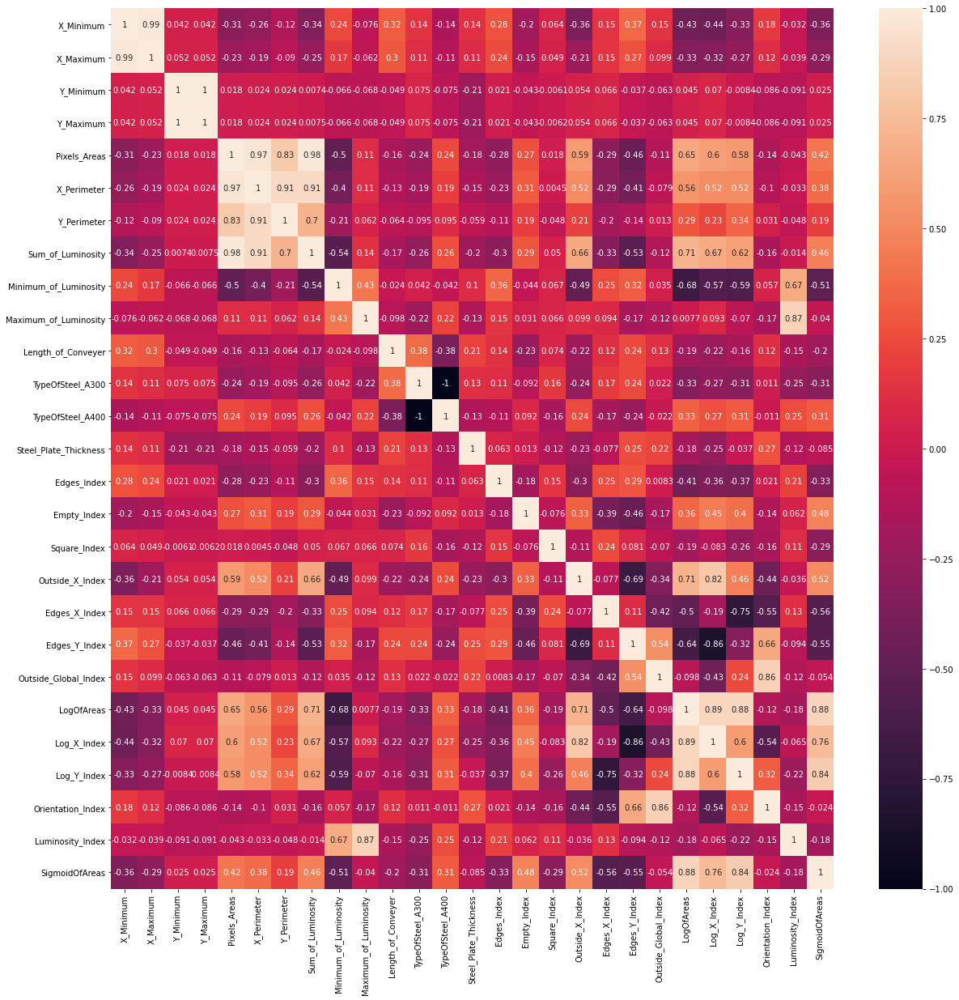

In [27]:
import seaborn as sns
corr= X.corr()
top_features=corr.index
plt.figure(figsize=(20,20))
sns.heatmap(X[top_features].corr(),annot=True)

Here as you can see none of the mutual information score is 0 and so we are uncertain about considering a set of features for model training. For now we would be considering all the features for model building.

#### c. Removing Multi collinear features

It is very necessary to remove one of multi collinear features because using all the features would not give any extra benefit to the model training and infact increase the training time and redundancy. 

Threshold can be any value according to a domian expert person and can conside based on co-relattion plot. Another efficient way is to plot a ROC AUC curve or check ROC AUC curve value and then set that value as a threshold to get the multicollinear features. In the following case I have taken a random thershold value and shown how we can find multicollinear feature and use or remove them according to the need.

In [28]:
threshold=0.9464042352548901
def correlation(dataset, threshold):
    col_corr = set()  
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: 
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [29]:
correlation(X,threshold)

{'Sum_of_Luminosity',
 'TypeOfSteel_A400',
 'X_Maximum',
 'X_Perimeter',
 'Y_Maximum'}

We can drop the above feature which are having high correlation but as the threshold here is selected randomly we cant trust on it. Domian expertise would be handy in this case for selecting the threshold.

Here the feature selection section ends. Selecting accurate features would help improve accuracy of the models but I have not selected any features as there is no certain evidence from all the above mentioned feature selection process and hence we are considering all the features for model training. 

### Feature Engineering and data preparation

In [30]:
# Splitting the data in training and testing set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [31]:
# Scaling the feature using standard scalar
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

### Model Development and Model Tuning

### 1. Random Forest Classifier

In [32]:
# Random forest model with random paramaters
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 50)
classifier.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=50)

In [33]:
# predicting the results
y_pred=classifier.predict(X_test)
y_pred_proba = classifier.predict_proba(X_test)

In [34]:
# Evaluating the model
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report, f1_score, roc_auc_score
from sklearn import metrics
def model_stats(y_test, y_pred):
    print(confusion_matrix(y_test,y_pred))
    print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
    print("Classification report: {}".format(classification_report(y_test,y_pred)))
    print("F1 Score {}".format(f1_score(y_test,y_pred, average='weighted')))

In [35]:
model_stats(y_test,y_pred)

[[ 69   0   1  38   5   0   0]
 [  1  15   0   5   0   0   0]
 [  3   0 115   4   1   0   0]
 [ 43   0   3 141   6   1   4]
 [  6   0   0  20  20   0   0]
 [  1   0   0   0   0  20   0]
 [  2   0   1   7   1   0  50]]
Accuracy Score 0.7375643224699828
Classification report:               precision    recall  f1-score   support

           0       0.55      0.61      0.58       113
           1       1.00      0.71      0.83        21
           2       0.96      0.93      0.95       123
           3       0.66      0.71      0.68       198
           4       0.61      0.43      0.51        46
           5       0.95      0.95      0.95        21
           6       0.93      0.82      0.87        61

    accuracy                           0.74       583
   macro avg       0.81      0.74      0.77       583
weighted avg       0.75      0.74      0.74       583

F1 Score 0.7392307116623452


In [36]:
roc_score_rf = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_rf)

ROC AUC Score:  0.9297755830513418


Here scoring metrics accuracy is giving less score as compared to roc_auc_ovo_weighted (One vs One). This is because the multi-class One-vs-One scheme compares every unique pairwise combination of classes. Weighted because it calculate metrics for each label, and find their average, weighted by support (the number of true instances for each label).

The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve. 

- OVO: Computes the average AUC of all possible pairwise combinations of classes.

- Weighted: Calculate metrics for each label, and find their average, weighted by support (the number of true instances for each label).

So for the further model evaluation we are using roc_auc_ovo_weighted as scoring metric.

### 1.A Randomized Search CV

Randomized search CV is bit faster than Grid search CV as it chooses the combination of the hyper parameter randomly. This methods will help you in deciding the hyper parameter of each algorithm so that you can get the best performance of the model with respect to your dataset.

In [37]:
#Creating certain sets of hyper parameters of Random forest for passing it to randomized serach cv
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [38]:
#Random forest model with randomized search CV
from sklearn.model_selection import RepeatedStratifiedKFold
rf=RandomForestClassifier()
rskf = RepeatedStratifiedKFold(n_splits=10, n_repeats=20)
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,cv=rskf,verbose=2,n_jobs=-1,n_iter=10, scoring = 'roc_auc_ovo_weighted')
### fit the randomized model
rf_randomcv.fit(X_train,y_train)

Fitting 200 folds for each of 10 candidates, totalling 2000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed: 28.7min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 37.8min
[Parallel(n_jobs=-1)]: Done 2000 out of 2000 | elapsed: 38.4min finished


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=20, n_splits=10, random_state=None),
                   estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   scoring='roc_

In [39]:
# Getting the best paramaters from the hyper parameter tuning
rf_randomcv.best_params_

{'n_estimators': 1800,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 890,
 'criterion': 'entropy'}

In [40]:
rf_randomcv.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=890, max_features='sqrt',
                       min_samples_leaf=2, min_samples_split=10,
                       n_estimators=1800)

In [41]:
best_random_grid=rf_randomcv.best_estimator_
y_pred=best_random_grid.predict(X_test)
model_stats(y_test,y_pred)

[[ 63   1   0  43   6   0   0]
 [  0  11   0  10   0   0   0]
 [  0   0 112  10   1   0   0]
 [ 31   0   2 155   5   1   4]
 [  2   0   0  20  24   0   0]
 [  0   0   0   1   0  20   0]
 [  0   0   2   5   0   0  54]]
Accuracy Score 0.7530017152658662
Classification report:               precision    recall  f1-score   support

           0       0.66      0.56      0.60       113
           1       0.92      0.52      0.67        21
           2       0.97      0.91      0.94       123
           3       0.64      0.78      0.70       198
           4       0.67      0.52      0.59        46
           5       0.95      0.95      0.95        21
           6       0.93      0.89      0.91        61

    accuracy                           0.75       583
   macro avg       0.82      0.73      0.76       583
weighted avg       0.76      0.75      0.75       583

F1 Score 0.75224989490319


In [42]:
y_pred_proba = best_random_grid.predict_proba(X_test)

In [43]:
print("ROC AUC Score {}".format(roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')))

ROC AUC Score 0.9507206545036425


In [44]:
rf_randomcv.scorer_

make_scorer(roc_auc_score, needs_proba=True, multi_class=ovo, average=weighted)

In [45]:
cv_results = rf_randomcv.cv_results_

In [46]:
scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

In [47]:
scores_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_criterion,...,split193_test_score,split194_test_score,split195_test_score,split196_test_score,split197_test_score,split198_test_score,split199_test_score,mean_test_score,std_test_score,rank_test_score
5,16.052651,0.125569,0.355737,0.015694,1800,10,2,sqrt,890,entropy,...,0.957027,0.935926,0.947570,0.966404,0.929750,0.962288,0.963176,0.952745,0.011684,1
2,10.597099,0.089153,0.242964,0.003508,1200,10,1,auto,10,entropy,...,0.955430,0.939163,0.948068,0.966813,0.927134,0.961022,0.962430,0.952357,0.011719,2
1,6.719535,0.055495,0.176496,0.007843,800,14,4,auto,450,entropy,...,0.955836,0.933449,0.947388,0.962704,0.924760,0.962267,0.959749,0.949840,0.012026,3
8,10.044109,0.069312,0.368057,0.015063,1800,14,1,sqrt,1000,gini,...,0.955991,0.934635,0.947964,0.963519,0.921158,0.956740,0.957711,0.949050,0.012247,4
0,10.031669,0.422582,0.287117,0.016450,1400,14,4,log2,1000,entropy,...,0.953917,0.932702,0.943433,0.962891,0.924181,0.959899,0.956731,0.948695,0.012145,5
4,8.662685,0.059026,0.331217,0.012186,1600,2,4,sqrt,1000,gini,...,0.953615,0.934159,0.945497,0.961175,0.923133,0.958265,0.957304,0.948399,0.012686,6
9,9.728367,0.240930,0.362801,0.026475,1800,5,4,sqrt,450,gini,...,0.954065,0.933801,0.944814,0.962140,0.922341,0.958578,0.957832,0.948338,0.012675,7
7,3.127554,0.022743,0.146040,0.002904,600,5,4,sqrt,10,gini,...,0.946872,0.927039,0.939715,0.960620,0.920054,0.957194,0.954608,0.946323,0.013038,8
6,10.033143,0.081971,0.398776,0.011814,2000,5,8,sqrt,230,gini,...,0.948019,0.927839,0.940164,0.956673,0.917677,0.953742,0.950393,0.942966,0.013153,9
3,4.014140,0.036352,0.183764,0.008297,800,10,8,auto,560,gini,...,0.947223,0.926658,0.941225,0.958151,0.916190,0.955595,0.950297,0.942820,0.013190,10


This model did a good job as it improved the model accuracy and performance than the base model

### 1.B Grid Search

Grid search CV is a bit different from randomized search CV. It is also a cross validation technique used to tune the model but unlike randomized search CV, Grid search takes more time to implement. This is because grid earch makes permutation combination of all the available parameters and hence it has a better chance to give best results.

Also here we are going to use something called as Repeated  Stratified K-fold technique. This method would split the traning data in n splits and k repetion along with keeping the balance between the ration of all the classes. This way the problem of imbalanced dataset has been solved.

In [48]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_features': [0.05, 0.07, 0.13, 0.15, 0.19, 0.25],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'],
                     rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'max_features': [0.05, 0.07, 0.13, 0.15, 0.19, 0.25], 'min_samples_split': [8, 10, 12], 'n_estimators': [1600, 1800, 2000]}


In [49]:
# RepeatedStratifiedKFold is used to repeat Stratified K-Fold n times with different randomization in each repetition. 
# This would solve the problem of imbalance dataset for this problem.
rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=10)
rf=RandomForestClassifier()
rf_grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
rf_grid_search.fit(X_train,y_train)

Fitting 50 folds for each of 54 candidates, totalling 2700 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 31.1min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 44.3min
[Parallel(n_jobs=-1)]: Done 2700 out of 2700 | elapsed: 47.1min finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_features': [0.05, 0.07, 0.13, 0.15, 0.19, 0.25],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [1600, 1800, 2000]},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [50]:
best_grid=rf_grid_search.best_estimator_
y_pred=best_grid.predict(X_test)
model_stats(y_test,y_pred)

[[ 65   1   0  42   5   0   0]
 [  1  11   0   9   0   0   0]
 [  0   0 114   8   1   0   0]
 [ 31   0   2 156   5   1   3]
 [  1   0   0  21  24   0   0]
 [  0   0   0   1   0  20   0]
 [  1   0   1   7   0   0  52]]
Accuracy Score 0.758147512864494
Classification report:               precision    recall  f1-score   support

           0       0.66      0.58      0.61       113
           1       0.92      0.52      0.67        21
           2       0.97      0.93      0.95       123
           3       0.64      0.79      0.71       198
           4       0.69      0.52      0.59        46
           5       0.95      0.95      0.95        21
           6       0.95      0.85      0.90        61

    accuracy                           0.76       583
   macro avg       0.82      0.73      0.77       583
weighted avg       0.77      0.76      0.76       583

F1 Score 0.7579006400415346


In [51]:
f1_score_rf = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_rf)

F1 Score:  0.7579006400415346


In [52]:
y_pred_rf = best_grid.predict_proba(X_test)
roc_score_rf = roc_auc_score(y_test,y_pred_rf, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_rf)

ROC AUC Score:  0.9506861007656872


In [53]:
# Storing the results of the hyper paramter tuning for futher analysis
cv_results = rf_grid_search.cv_results_
scores_rf_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_rf_grid.to_csv(r'rf_scores.csv', index =False)

As it can be seen Grid Search gave marginal improvement to the result as compared to Randomized Search CV.

In [54]:
scores_rf_grid

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,...,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score
46,10.529705,0.066376,0.401025,0.008472,0.25,8,1800,"{'max_features': 0.25, 'min_samples_split': 8,...",0.939362,0.954514,...,0.961239,0.943938,0.946729,0.945959,0.941973,0.968336,0.948451,0.949338,0.007967,1
45,9.362499,0.060752,0.361430,0.009351,0.25,8,1600,"{'max_features': 0.25, 'min_samples_split': 8,...",0.940383,0.955225,...,0.960323,0.943536,0.946028,0.944925,0.942051,0.968476,0.948386,0.949072,0.008271,2
47,11.704967,0.075046,0.443166,0.011311,0.25,8,2000,"{'max_features': 0.25, 'min_samples_split': 8,...",0.940940,0.954624,...,0.959823,0.943904,0.946651,0.943825,0.942264,0.968241,0.948473,0.949061,0.008093,3
38,10.650419,0.072015,0.442149,0.009909,0.19,8,2000,"{'max_features': 0.19, 'min_samples_split': 8,...",0.939469,0.954875,...,0.958837,0.943999,0.945796,0.943376,0.941818,0.967842,0.947842,0.948822,0.008080,4
37,9.594502,0.059034,0.403833,0.008679,0.19,8,1800,"{'max_features': 0.19, 'min_samples_split': 8,...",0.940035,0.954820,...,0.959168,0.943792,0.946436,0.944369,0.942022,0.968223,0.948869,0.948820,0.007990,5
36,8.529361,0.067245,0.363613,0.011264,0.19,8,1600,"{'max_features': 0.19, 'min_samples_split': 8,...",0.939845,0.955035,...,0.960088,0.943810,0.946848,0.944977,0.943286,0.967391,0.947823,0.948749,0.008024,6
48,9.262189,0.066070,0.361409,0.010796,0.25,10,1600,"{'max_features': 0.25, 'min_samples_split': 10...",0.939543,0.954323,...,0.959473,0.943291,0.946142,0.944633,0.940858,0.968025,0.948270,0.948538,0.008217,7
50,11.579698,0.069749,0.443058,0.011354,0.25,10,2000,"{'max_features': 0.25, 'min_samples_split': 10...",0.939092,0.954273,...,0.959437,0.943350,0.945679,0.944754,0.941444,0.968454,0.947730,0.948496,0.008197,8
49,10.411994,0.075330,0.405788,0.013590,0.25,10,1800,"{'max_features': 0.25, 'min_samples_split': 10...",0.938374,0.953985,...,0.959746,0.942892,0.945938,0.945188,0.942249,0.968198,0.947982,0.948485,0.008113,9
29,9.608029,0.064370,0.443662,0.008096,0.15,8,2000,"{'max_features': 0.15, 'min_samples_split': 8,...",0.941320,0.954628,...,0.957540,0.943622,0.943070,0.944949,0.943292,0.967264,0.947013,0.948312,0.007759,10


### 1.C Evaluating the Random Forest Grid Search Results

- Random Forest with grid search CV gave F1 Score of 0.7579006400415346 and ROC AUC Score of 0.9506861007656872 which are better compared to the model without grid search CV. Generally bagging techniques work well in most of the scenarios as it contains multiple decision tree and generally dosen't have any significant effect on the result even if we transfrom the data. But feature selection can surely positive impact on the result of the model.

- We can include more hyper parameters and recheck if the model improves.

- Now we are going to check how does each parameter performed in terms of Grid Search results.

In [55]:
def GridSearch_table_plot(grid_clf, param_name,
                          num_results=15,
                          negative=True,
                          graph=True,
                          display_all_params=True):
    
    from matplotlib import pyplot as plt
    from IPython.display import display
    import pandas as pd

    clf = grid_clf.best_estimator_
    clf_params = grid_clf.best_params_
    if negative:
        clf_score = -grid_clf.best_score_
    else:
        clf_score = grid_clf.best_score_
    clf_stdev = grid_clf.cv_results_['std_test_score'][grid_clf.best_index_]
    cv_results = grid_clf.cv_results_

    print("best parameters: {}".format(clf_params))
    print("best ROC_AUC score:      {:0.5f} (+/-{:0.5f})".format(clf_score, clf_stdev))
    # pick out the best results
    # =========================
    scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

    best_row = scores_df.iloc[0, :]
    if negative:
        best_mean = -best_row['mean_test_score']
    else:
        best_mean = best_row['mean_test_score']
    best_stdev = best_row['std_test_score']
    best_param = best_row['param_' + param_name]

    # plot the results
    # ================
    scores_df = scores_df.sort_values(by='param_' + param_name)

    if negative:
        means = -scores_df['mean_test_score']
    else:
        means = scores_df['mean_test_score']
    stds = scores_df['std_test_score']
    params = scores_df['param_' + param_name]

    # plot
    if graph:
        plt.figure(figsize=(8, 8))
        plt.errorbar(params, means, yerr=stds)

        plt.axhline(y=best_mean + best_stdev, color='red')
        plt.axhline(y=best_mean - best_stdev, color='red')
        plt.plot(best_param, best_mean, 'or')

        plt.title(param_name + " vs ROC_AUC Score\nBest Score {:0.5f}".format(clf_score))
        plt.xlabel(param_name)
        plt.ylabel('ROC_AUC Score')
        plt.show()

As we can see below plots shows how each hyper parameter used in Random forest performed with respect to ROC_AUC_Score and the wide bars in between the two bars shows the error rate. The red lines indicates the sum and difference between the best mean and best std deviation of the grid search results. The red dot indicated the optimal score of the model given by grid search CV.

best parameters: {'max_features': 0.25, 'min_samples_split': 8, 'n_estimators': 1800}
best ROC_AUC score:      0.94934 (+/-0.00797)


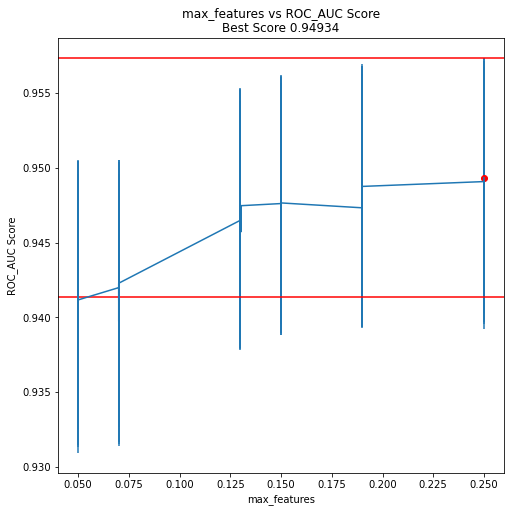

In [56]:
GridSearch_table_plot(rf_grid_search, "max_features", negative=False)

best parameters: {'max_features': 0.25, 'min_samples_split': 8, 'n_estimators': 1800}
best ROC_AUC score:      0.94934 (+/-0.00797)


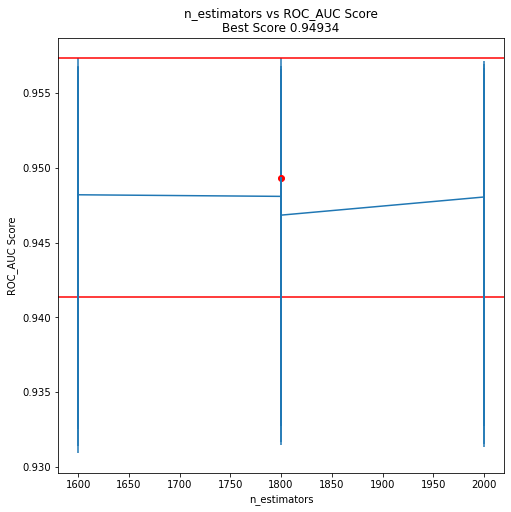

In [57]:
GridSearch_table_plot(rf_grid_search, "n_estimators", negative=False)

best parameters: {'max_features': 0.25, 'min_samples_split': 8, 'n_estimators': 1800}
best ROC_AUC score:      0.94934 (+/-0.00797)


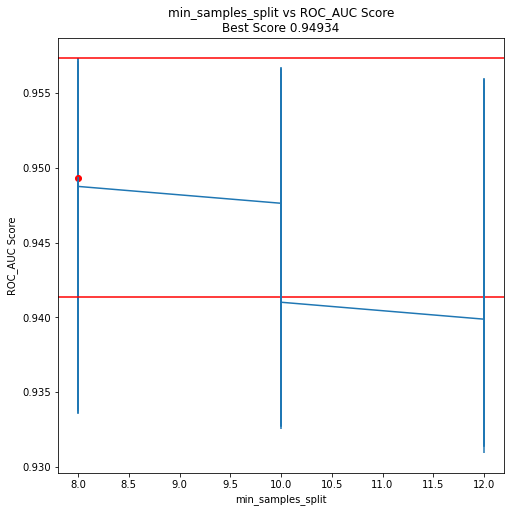

In [58]:
GridSearch_table_plot(rf_grid_search, "min_samples_split", negative=False)

<b> Similarly the rest of the model development using diffrent machine learning algorithm has been carried out below. Only to decrease the training time I have used less number of hyper parameter while tuning the model and have only used Grid Serach CV for the model tuning process. 

Also we are storing the resuts of the grid search CV in a CSV format so that we can use it later for hyper parameter analysis</b>

### 2. Logistic Regression

In [59]:
from sklearn.linear_model import LogisticRegression
logmodel = LogisticRegression(random_state=0, multi_class='ovr')
logmodel.fit(X_train,y_train)
pred = logmodel.predict(X_test)
model_stats(y_test, pred)

[[ 63   1   2  41   4   0   2]
 [  0   8   0  12   1   0   0]
 [  2   0 115   3   3   0   0]
 [ 38   0  11 126  15   1   7]
 [  4   0   0  18  22   0   2]
 [  0   0   0   0   0  21   0]
 [  2   0   2   3   0   0  54]]
Accuracy Score 0.7015437392795884
Classification report:               precision    recall  f1-score   support

           0       0.58      0.56      0.57       113
           1       0.89      0.38      0.53        21
           2       0.88      0.93      0.91       123
           3       0.62      0.64      0.63       198
           4       0.49      0.48      0.48        46
           5       0.95      1.00      0.98        21
           6       0.83      0.89      0.86        61

    accuracy                           0.70       583
   macro avg       0.75      0.70      0.71       583
weighted avg       0.70      0.70      0.70       583

F1 Score 0.6974637136682061


In [60]:
y_pred_proba = logmodel.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9018771026571151


### 2.A Grid Search

In [61]:
param_grid = {
    'C': [0.1, 1, 10, 100, 150],
    'penalty': ['l2', 'none'],
    'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
    'multi_class': ['ovr', 'multinomial', 'auto']
}

In [62]:
lg=LogisticRegression()
lg_grid_search=GridSearchCV(estimator=lg,param_grid=param_grid,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
lg_grid_search.fit(X_train,y_train)

Fitting 50 folds for each of 120 candidates, totalling 6000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 445 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 728 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1093 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1538 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2065 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 2672 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 3361 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 4130 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 4981 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 5912 tasks      | elapsed: 12.0min
[Parallel(n_jobs=-1)]: Done 6000 out of 6000 | elapsed: 12.1min finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 150],
                         'multi_class': ['ovr', 'multinomial', 'auto'],
                         'penalty': ['l2', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [63]:
best_grid_lg=lg_grid_search.best_estimator_
y_pred=best_grid_lg.predict(X_test)
model_stats(y_test,y_pred)

[[ 62   2   2  41   4   0   2]
 [  0   8   0  11   2   0   0]
 [  1   0 114   6   2   0   0]
 [ 36   1   8 129  15   1   8]
 [  5   0   0  13  27   0   1]
 [  0   0   0   0   0  21   0]
 [  1   1   2   2   0   0  55]]
Accuracy Score 0.7135506003430532
Classification report:               precision    recall  f1-score   support

           0       0.59      0.55      0.57       113
           1       0.67      0.38      0.48        21
           2       0.90      0.93      0.92       123
           3       0.64      0.65      0.65       198
           4       0.54      0.59      0.56        46
           5       0.95      1.00      0.98        21
           6       0.83      0.90      0.87        61

    accuracy                           0.71       583
   macro avg       0.73      0.71      0.72       583
weighted avg       0.71      0.71      0.71       583

F1 Score 0.7101455010977372


In [64]:
f1_score_lg = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_lg)

F1 Score:  0.7101455010977372


In [65]:
y_pred_lg = best_grid_lg.predict_proba(X_test)
roc_score_lg = roc_auc_score(y_test,y_pred_lg, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_lg)

ROC AUC Score:  0.9189578248370598


In [66]:
cv_results = lg_grid_search.cv_results_
scores_lg_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_lg_grid.to_csv(r'lg_scores.csv', index =False)

In [67]:
scores_lg_grid

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_multi_class,param_penalty,param_solver,params,split0_test_score,...,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score
56,0.376937,0.040914,0.044752,0.001424,10,multinomial,l2,newton-cg,"{'C': 10, 'multi_class': 'multinomial', 'penal...",0.931001,...,0.915876,0.907095,0.917992,0.927639,0.908060,0.932475,0.934800,0.923741,0.011202,1
64,0.375958,0.038340,0.044861,0.000671,10,auto,l2,newton-cg,"{'C': 10, 'multi_class': 'auto', 'penalty': 'l...",0.931001,...,0.915876,0.907095,0.917992,0.927639,0.908060,0.932475,0.934800,0.923741,0.011202,1
57,0.140994,0.003891,0.043707,0.001711,10,multinomial,l2,lbfgs,"{'C': 10, 'multi_class': 'multinomial', 'penal...",0.930812,...,0.915843,0.905805,0.917671,0.926797,0.907546,0.931511,0.934868,0.923444,0.011344,3
65,0.140074,0.002918,0.043585,0.001586,10,auto,l2,lbfgs,"{'C': 10, 'multi_class': 'auto', 'penalty': 'l...",0.930812,...,0.915843,0.905805,0.917671,0.926797,0.907546,0.931511,0.934868,0.923444,0.011344,3
88,0.887828,0.107800,0.045188,0.000632,100,auto,l2,newton-cg,"{'C': 100, 'multi_class': 'auto', 'penalty': '...",0.929603,...,0.915348,0.907346,0.917179,0.929312,0.907692,0.932176,0.929709,0.923011,0.011076,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,0.561660,0.007583,0.038855,0.001884,100,ovr,none,saga,"{'C': 100, 'multi_class': 'ovr', 'penalty': 'n...",0.906134,...,0.913112,0.877630,0.881846,0.897554,0.890017,0.900494,0.923893,0.899696,0.013253,116
75,0.630714,0.021677,0.038189,0.002119,100,ovr,l2,saga,"{'C': 100, 'multi_class': 'ovr', 'penalty': 'l...",0.906020,...,0.913083,0.877708,0.881755,0.897552,0.890008,0.900487,0.923892,0.899684,0.013251,117
51,0.639856,0.017572,0.038084,0.001968,10,ovr,l2,saga,"{'C': 10, 'multi_class': 'ovr', 'penalty': 'l2...",0.905873,...,0.913234,0.877786,0.881741,0.897447,0.889966,0.900538,0.923675,0.899655,0.013232,118
27,0.637284,0.017626,0.038738,0.002120,1,ovr,l2,saga,"{'C': 1, 'multi_class': 'ovr', 'penalty': 'l2'...",0.905607,...,0.912485,0.877487,0.881470,0.897387,0.890140,0.900201,0.922224,0.899346,0.013170,119


### 2.B Evaluating the Logistic Regression Grid Search Results

best parameters: {'C': 10, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
best ROC_AUC score:      0.92374 (+/-0.01120)


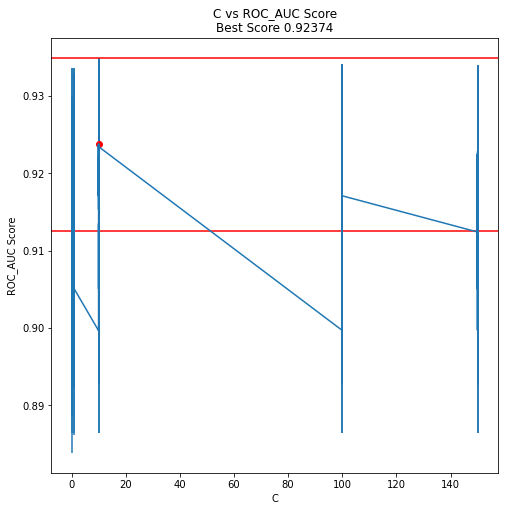

In [68]:
GridSearch_table_plot(lg_grid_search, "C", negative=False)

best parameters: {'C': 10, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
best ROC_AUC score:      0.92374 (+/-0.01120)


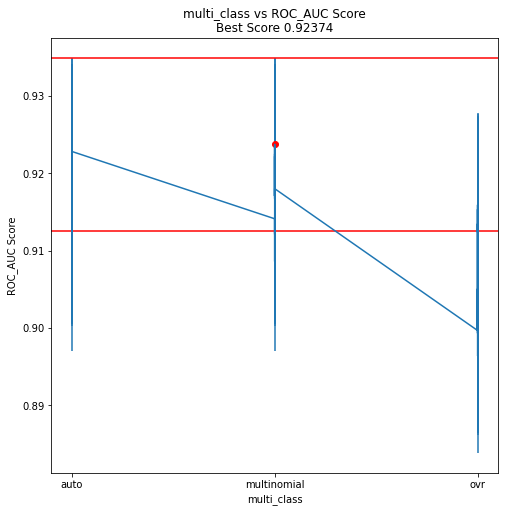

In [69]:
GridSearch_table_plot(lg_grid_search, "multi_class", negative=False)

best parameters: {'C': 10, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
best ROC_AUC score:      0.92374 (+/-0.01120)


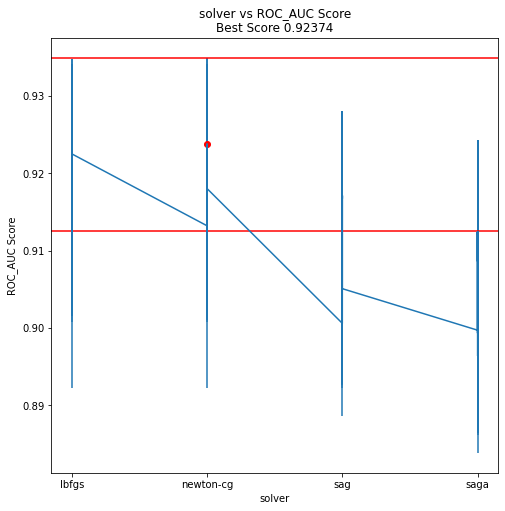

In [70]:
GridSearch_table_plot(lg_grid_search, "solver", negative=False)

best parameters: {'C': 10, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}
best ROC_AUC score:      0.92374 (+/-0.01120)


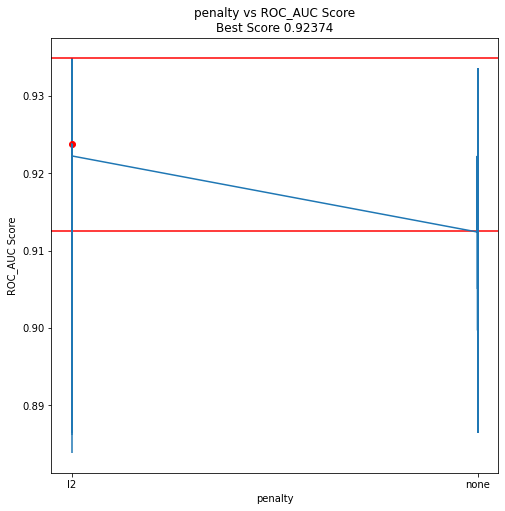

In [71]:
GridSearch_table_plot(lg_grid_search, "penalty", negative=False)

### 3. SVM

In [72]:
from sklearn.svm import SVC
clf = SVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
model_stats(y_test,y_pred)

[[ 71   0   0  38   3   0   1]
 [  2   6   0  13   0   0   0]
 [  1   0 114   7   1   0   0]
 [ 41   0   2 142   5   1   7]
 [  6   0   0  16  24   0   0]
 [  0   0   0   1   0  20   0]
 [  2   0   0   5   0   0  54]]
Accuracy Score 0.7392795883361921
Classification report:               precision    recall  f1-score   support

           0       0.58      0.63      0.60       113
           1       1.00      0.29      0.44        21
           2       0.98      0.93      0.95       123
           3       0.64      0.72      0.68       198
           4       0.73      0.52      0.61        46
           5       0.95      0.95      0.95        21
           6       0.87      0.89      0.88        61

    accuracy                           0.74       583
   macro avg       0.82      0.70      0.73       583
weighted avg       0.76      0.74      0.74       583

F1 Score 0.7376669431818719


### 3.A SVM Grid Search

In [73]:
from sklearn.model_selection import GridSearchCV
C = [0.001,0.01,0.1,1,10,100,1000]
kernel = ['linear', 'rbf']
gamma = [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto']
decision_function_shape = ['ovo', 'ovr']
svm_grid = {'C': C,
               'kernel': kernel,
               'gamma':gamma,
               'decision_function_shape': decision_function_shape}
print(svm_grid)

{'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'kernel': ['linear', 'rbf'], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale', 'auto'], 'decision_function_shape': ['ovo', 'ovr']}


In [74]:
sv = SVC()
sv_gridcv=GridSearchCV(estimator=sv,param_grid=svm_grid,cv=rskf,n_jobs=-1,verbose=2,refit = True)
sv_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 196 candidates, totalling 9800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 682 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 1248 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 1978 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done 2868 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 3922 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 5136 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 6514 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 7546 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8397 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 9328 tasks      | elapsed: 52.4min
[Parallel(n_jobs=-1)]: Done 9800 out of 9800 | elapsed: 72.3min finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'decision_function_shape': ['ovo', 'ovr'],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale',
                                   'auto'],
                         'kernel': ['linear', 'rbf']},
             verbose=2)

In [75]:
best_grid_sv=sv_gridcv.best_estimator_
y_pred=best_grid_sv.predict(X_test)
model_stats(y_test,y_pred)

[[ 72   0   0  35   4   0   2]
 [  6  12   0   3   0   0   0]
 [  2   0 115   5   1   0   0]
 [ 37   0   4 143   8   1   5]
 [  2   0   0  17  27   0   0]
 [  0   0   0   1   0  20   0]
 [  1   0   1   3   1   0  55]]
Accuracy Score 0.7615780445969125
Classification report:               precision    recall  f1-score   support

           0       0.60      0.64      0.62       113
           1       1.00      0.57      0.73        21
           2       0.96      0.93      0.95       123
           3       0.69      0.72      0.71       198
           4       0.66      0.59      0.62        46
           5       0.95      0.95      0.95        21
           6       0.89      0.90      0.89        61

    accuracy                           0.76       583
   macro avg       0.82      0.76      0.78       583
weighted avg       0.77      0.76      0.76       583

F1 Score 0.7623605182144086


In [76]:
f1_score_sv = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_sv)

F1 Score:  0.7623605182144086


In [77]:
cv_results = sv_gridcv.cv_results_
scores_sv_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_sv_grid.to_csv(r'sv_scores.csv', index =False)

### 3.B Evaluating the Support Vector Machine Grid Search Results

best parameters: {'C': 10, 'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'rbf'}
best ROC_AUC score:      0.75994 (+/-0.02118)


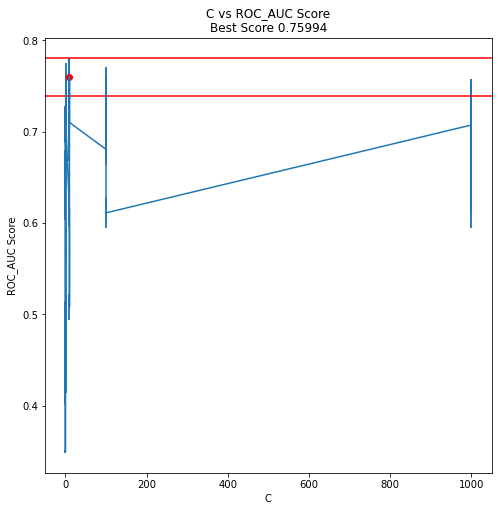

In [78]:
GridSearch_table_plot(sv_gridcv, "C", negative=False)

best parameters: {'C': 10, 'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'rbf'}
best ROC_AUC score:      0.75994 (+/-0.02118)


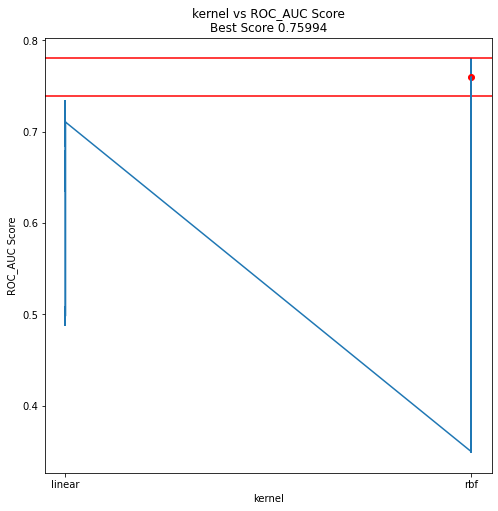

In [79]:
GridSearch_table_plot(sv_gridcv, "kernel", negative=False)

best parameters: {'C': 10, 'decision_function_shape': 'ovo', 'gamma': 'auto', 'kernel': 'rbf'}
best ROC_AUC score:      0.75994 (+/-0.02118)


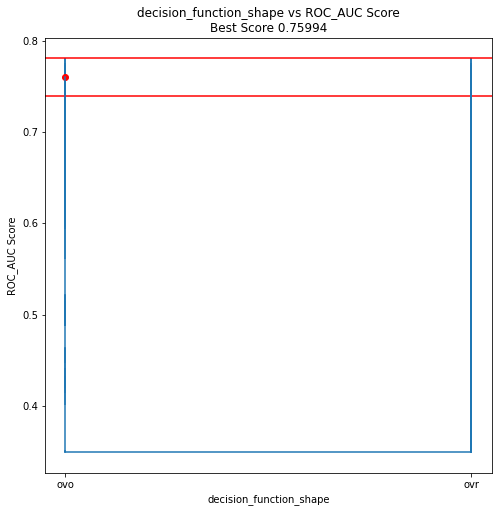

In [80]:
GridSearch_table_plot(sv_gridcv, "decision_function_shape", negative=False)

### 4. XG Boost

In [81]:
from xgboost import XGBClassifier
classifier= XGBClassifier(objective= 'multi:softmax')
classifier.fit(X_train,y_train)
y_pred = classifier.predict(X_test)
model_stats(y_test,y_pred)

[[ 77   0   0  29   6   1   0]
 [  1  16   0   4   0   0   0]
 [  1   0 115   7   0   0   0]
 [ 32   0   5 153   6   1   1]
 [  3   0   0  12  31   0   0]
 [  0   0   0   1   0  20   0]
 [  0   0   1   2   0   0  58]]
Accuracy Score 0.8061749571183533
Classification report:               precision    recall  f1-score   support

           0       0.68      0.68      0.68       113
           1       1.00      0.76      0.86        21
           2       0.95      0.93      0.94       123
           3       0.74      0.77      0.75       198
           4       0.72      0.67      0.70        46
           5       0.91      0.95      0.93        21
           6       0.98      0.95      0.97        61

    accuracy                           0.81       583
   macro avg       0.85      0.82      0.83       583
weighted avg       0.81      0.81      0.81       583

F1 Score 0.8071073745556456


In [82]:
y_pred_proba = classifier.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9583259389184962


### 4.A XGB Grid Search

In [83]:
max_dept = [4,5,7,9]
min_child_weight = [4,5,6]
gamma = [0,1,2,3,4]
reg_alpha = [0, 0.001, 0.005, 0.01, 0.05]
objective = ['multi:softmax']
num_class = [7]

hyperparameters = {
        "max_depth":max_dept,
        "min_child_weight":min_child_weight,
        "gamma":gamma,
        "objective": objective,
        "num_class" : num_class,
        "reg_alpha":reg_alpha
        }
print(hyperparameters)

{'max_depth': [4, 5, 7, 9], 'min_child_weight': [4, 5, 6], 'gamma': [0, 1, 2, 3, 4], 'objective': ['multi:softmax'], 'num_class': [7], 'reg_alpha': [0, 0.001, 0.005, 0.01, 0.05]}


In [84]:
xg = XGBClassifier()
xg_gridcv=GridSearchCV(estimator=xg,param_grid=hyperparameters,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
xg_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 300 candidates, totalling 15000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 3265 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed: 14.2min
[Parallel(n_jobs=-1)]: Done 4885 tasks      | elapsed: 17.8min
[Parallel(n_jobs=-1)]: Done 5816 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 6829 tasks      | elapsed: 26.2min
[Parallel(n_jobs=-1)]: Done 7922 tasks      | elapsed: 31.2min
[Parallel(n_jobs=-1)]: Done 9097 tasks      | e

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=N...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, validate_parameters=None,
                                     verbosity=None)

In [85]:
best_grid_xg=xg_gridcv.best_estimator_
y_pred=best_grid_xg.predict(X_test)
model_stats(y_test,y_pred)

[[ 70   1   0  36   6   0   0]
 [  0  12   0   9   0   0   0]
 [  3   0 115   5   0   0   0]
 [ 36   0   3 149   5   1   4]
 [  5   0   0  11  30   0   0]
 [  0   0   0   1   0  20   0]
 [  1   0   1   1   0   0  58]]
Accuracy Score 0.7787307032590052
Classification report:               precision    recall  f1-score   support

           0       0.61      0.62      0.61       113
           1       0.92      0.57      0.71        21
           2       0.97      0.93      0.95       123
           3       0.70      0.75      0.73       198
           4       0.73      0.65      0.69        46
           5       0.95      0.95      0.95        21
           6       0.94      0.95      0.94        61

    accuracy                           0.78       583
   macro avg       0.83      0.78      0.80       583
weighted avg       0.78      0.78      0.78       583

F1 Score 0.7792025885212093


In [86]:
f1_score_xg = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_xg)

F1 Score:  0.7792025885212093


In [87]:
y_pred_xg = best_grid_xg.predict_proba(X_test)
roc_score_xg = roc_auc_score(y_test,y_pred_xg, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_xg)

ROC AUC Score:  0.9544783863637324


In [88]:
cv_results = xg_gridcv.cv_results_
scores_xg_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_xg_grid.to_csv(r'xg_scores.csv', index =False)

### 4.B Evaluating the XG Boost Grid Search Results

best parameters: {'gamma': 0, 'max_depth': 4, 'min_child_weight': 4, 'num_class': 7, 'objective': 'multi:softmax', 'reg_alpha': 0}
best ROC_AUC score:      0.94965 (+/-0.00925)


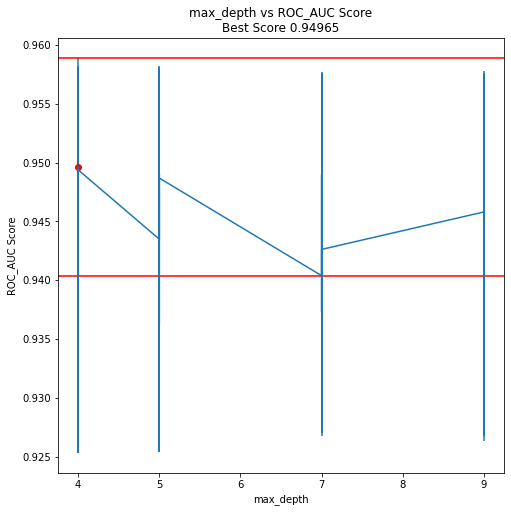

In [89]:
GridSearch_table_plot(xg_gridcv, "max_depth", negative=False)

best parameters: {'gamma': 0, 'max_depth': 4, 'min_child_weight': 4, 'num_class': 7, 'objective': 'multi:softmax', 'reg_alpha': 0}
best ROC_AUC score:      0.94965 (+/-0.00925)


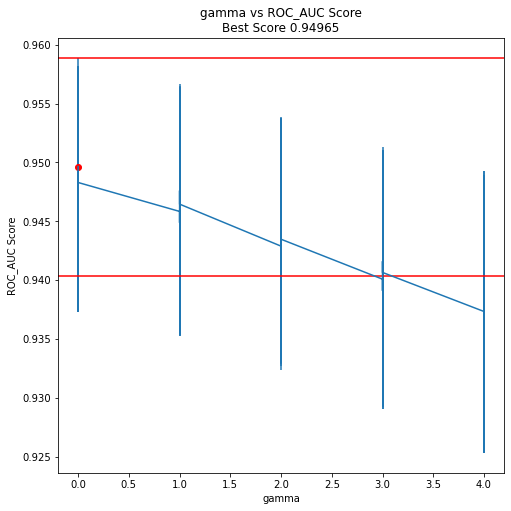

In [90]:
GridSearch_table_plot(xg_gridcv, "gamma", negative=False)

best parameters: {'gamma': 0, 'max_depth': 4, 'min_child_weight': 4, 'num_class': 7, 'objective': 'multi:softmax', 'reg_alpha': 0}
best ROC_AUC score:      0.94965 (+/-0.00925)


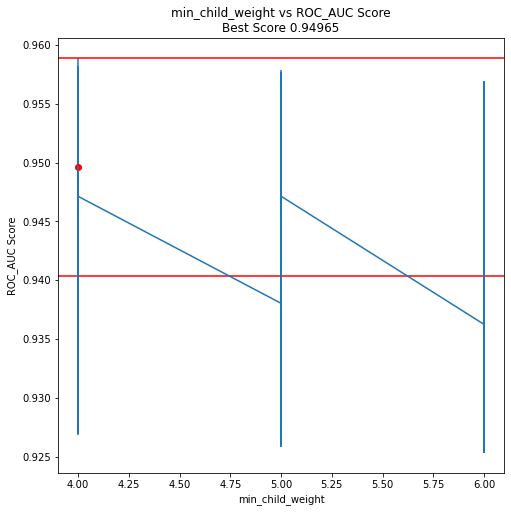

In [91]:
GridSearch_table_plot(xg_gridcv, "min_child_weight", negative=False)

best parameters: {'gamma': 0, 'max_depth': 4, 'min_child_weight': 4, 'num_class': 7, 'objective': 'multi:softmax', 'reg_alpha': 0}
best ROC_AUC score:      0.94965 (+/-0.00925)


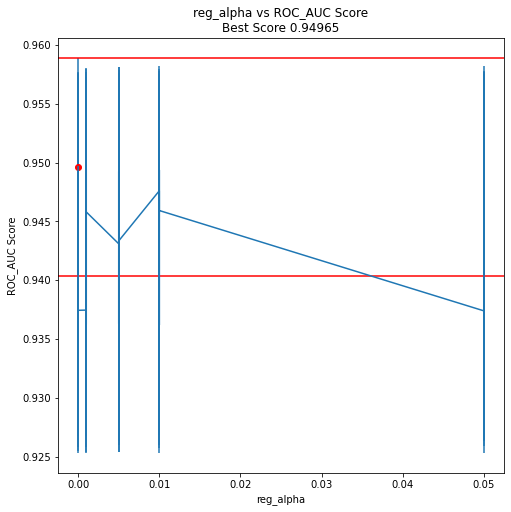

In [92]:
GridSearch_table_plot(xg_gridcv, "reg_alpha", negative=False)

### 5. Naive Bayes

In [93]:
y_train.unique()

array([3, 0, 5, 2, 4, 6, 1])

In [94]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB().fit(X_train, y_train)
y_pred = model.predict(X_test)
model_stats(y_test,y_pred)

[[ 83   6   1   7  15   1   0]
 [  6  14   0   0   0   0   1]
 [  4   0 110   8   1   0   0]
 [ 79  14  11  56  32   1   5]
 [  9   2   0   1  32   0   2]
 [  1   0   0   0   0  20   0]
 [  6   2   2   1   0   0  50]]
Accuracy Score 0.6260720411663808
Classification report:               precision    recall  f1-score   support

           0       0.44      0.73      0.55       113
           1       0.37      0.67      0.47        21
           2       0.89      0.89      0.89       123
           3       0.77      0.28      0.41       198
           4       0.40      0.70      0.51        46
           5       0.91      0.95      0.93        21
           6       0.86      0.82      0.84        61

    accuracy                           0.63       583
   macro avg       0.66      0.72      0.66       583
weighted avg       0.70      0.63      0.61       583

F1 Score 0.613774305373431


In [95]:
y_pred_proba = model.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9011042598980183


### 5.A NB Grid Search

In [96]:
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

In [97]:
nb = GaussianNB()
nb_gridcv=GridSearchCV(estimator=nb,param_grid=params_NB,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
nb_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 100 candidates, totalling 5000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 1316 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 2448 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 3908 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 5000 out of 5000 | elapsed:   30.4s finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=GaussianNB(), n_jobs=-1,
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [98]:
best_grid_nb=nb_gridcv.best_estimator_
y_pred=best_grid_nb.predict(X_test)
model_stats(y_test,y_pred)

[[ 83   6   1   7  15   1   0]
 [  6  14   0   0   0   0   1]
 [  4   0 110   8   1   0   0]
 [ 77  14  11  56  32   3   5]
 [  9   2   0   1  32   0   2]
 [  1   0   0   0   0  20   0]
 [  6   2   2   1   0   0  50]]
Accuracy Score 0.6260720411663808
Classification report:               precision    recall  f1-score   support

           0       0.45      0.73      0.56       113
           1       0.37      0.67      0.47        21
           2       0.89      0.89      0.89       123
           3       0.77      0.28      0.41       198
           4       0.40      0.70      0.51        46
           5       0.83      0.95      0.89        21
           6       0.86      0.82      0.84        61

    accuracy                           0.63       583
   macro avg       0.65      0.72      0.65       583
weighted avg       0.70      0.63      0.61       583

F1 Score 0.6130000892873886


In [99]:
f1_score_nb = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_nb)

F1 Score:  0.6130000892873886


In [100]:
y_pred_nb = best_grid_nb.predict_proba(X_test)
roc_score_nb = roc_auc_score(y_test,y_pred_nb, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_nb)

ROC AUC Score:  0.9010069308472798


In [101]:
cv_results = nb_gridcv.cv_results_
scores_nb_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_nb_grid.to_csv(r'nb_scores.csv', index =False)

### 5.B Evaluating the Naive Bayes Grid Search Results

best parameters: {'var_smoothing': 1.2328467394420658e-05}
best ROC_AUC score:      0.91239 (+/-0.01257)


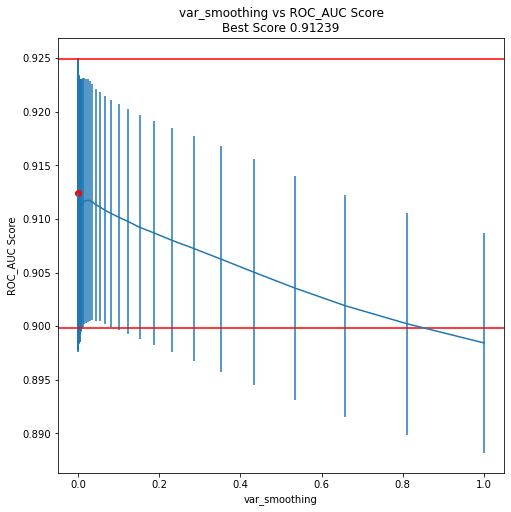

In [102]:
GridSearch_table_plot(nb_gridcv, "var_smoothing", negative=False)

### 6. KNN

In [104]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 7).fit(X_train, y_train) 
knn_predictions = knn.predict(X_test)
model_stats(y_test,knn_predictions)

[[ 72   0   1  34   3   1   2]
 [  7  13   0   1   0   0   0]
 [  2   0 115   6   0   0   0]
 [ 44   0   6 128  11   1   8]
 [  7   0   0  16  23   0   0]
 [  1   0   0   1   0  19   0]
 [  1   0   2   4   0   0  54]]
Accuracy Score 0.7272727272727273
Classification report:               precision    recall  f1-score   support

           0       0.54      0.64      0.58       113
           1       1.00      0.62      0.76        21
           2       0.93      0.93      0.93       123
           3       0.67      0.65      0.66       198
           4       0.62      0.50      0.55        46
           5       0.90      0.90      0.90        21
           6       0.84      0.89      0.86        61

    accuracy                           0.73       583
   macro avg       0.79      0.73      0.75       583
weighted avg       0.73      0.73      0.73       583

F1 Score 0.727802624624949


In [105]:
y_pred_proba = knn.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9226095392319715


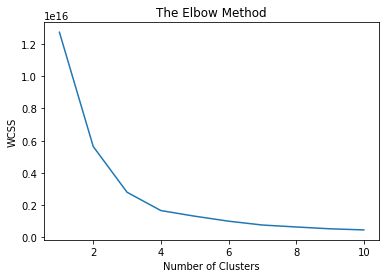

In [106]:
from sklearn.cluster import KMeans

wcss=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i, init='k-means++',random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

### 6.A KNN Grid Search

In [107]:
grid_params = {
    'n_neighbors': [3,4,5,7,9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

In [108]:
kn = KNeighborsClassifier()
kn_gridcv=GridSearchCV(estimator=kn,param_grid=grid_params,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
kn_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 20 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    8.6s finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 4, 5, 7, 9],
                         'weights': ['uniform', 'distance']},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [109]:
best_grid_kn=kn_gridcv.best_estimator_
y_pred=best_grid_kn.predict(X_test)
model_stats(y_test,y_pred)

[[ 74   0   1  31   3   1   3]
 [  3  15   0   3   0   0   0]
 [  1   0 115   5   2   0   0]
 [ 41   0   4 134  10   1   8]
 [  7   0   0  17  21   0   1]
 [  0   0   0   1   0  20   0]
 [  0   0   1   5   1   0  54]]
Accuracy Score 0.7427101200686106
Classification report:               precision    recall  f1-score   support

           0       0.59      0.65      0.62       113
           1       1.00      0.71      0.83        21
           2       0.95      0.93      0.94       123
           3       0.68      0.68      0.68       198
           4       0.57      0.46      0.51        46
           5       0.91      0.95      0.93        21
           6       0.82      0.89      0.85        61

    accuracy                           0.74       583
   macro avg       0.79      0.75      0.77       583
weighted avg       0.75      0.74      0.74       583

F1 Score 0.742339158313364


In [110]:
f1_score_kn = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_kn)

F1 Score:  0.742339158313364


In [111]:
y_pred_kn= best_grid_kn.predict_proba(X_test)
roc_score_kn = roc_auc_score(y_test,y_pred_kn, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_kn)

ROC AUC Score:  0.9341777601502633


In [112]:
cv_results = kn_gridcv.cv_results_
scores_kn_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_kn_grid.to_csv(r'kn_scores.csv', index =False)

### 6.B Evaluating the K-Nearest Neighbour Grid Search Results

best parameters: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
best ROC_AUC score:      0.92891 (+/-0.01285)


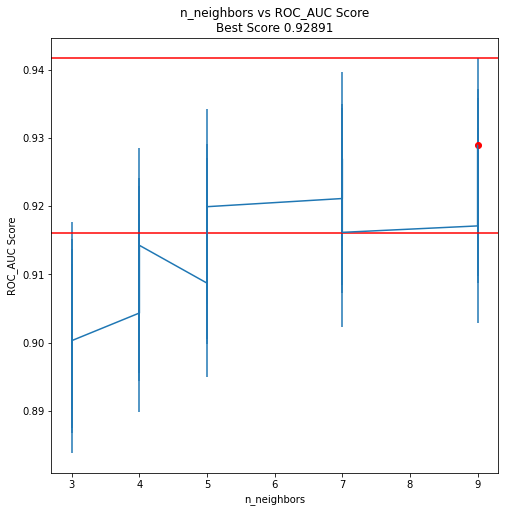

In [113]:
GridSearch_table_plot(kn_gridcv, "n_neighbors", negative=False)

best parameters: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
best ROC_AUC score:      0.92891 (+/-0.01285)


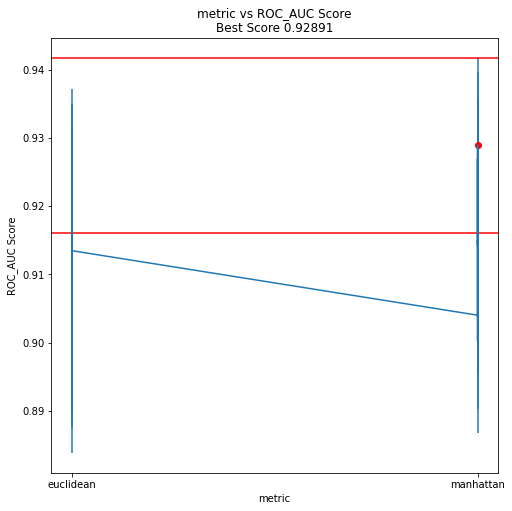

In [114]:
GridSearch_table_plot(kn_gridcv, "metric", negative=False)

best parameters: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
best ROC_AUC score:      0.92891 (+/-0.01285)


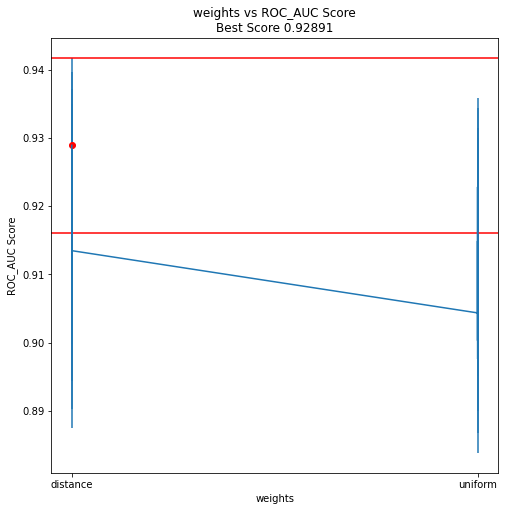

In [115]:
GridSearch_table_plot(kn_gridcv, "weights", negative=False)

### 7. ADA Boost

In [116]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
model_stats(y_test,y_pred)

[[  0   1   1 110   0   1   0]
 [  0   0   0  21   0   0   0]
 [  0   0  99  24   0   0   0]
 [  0   1   7 187   0   3   0]
 [  0   1   0  45   0   0   0]
 [  0   0   0   1   0  20   0]
 [  0   0   1  60   0   0   0]]
Accuracy Score 0.5248713550600344
Classification report:               precision    recall  f1-score   support

           0       0.00      0.00      0.00       113
           1       0.00      0.00      0.00        21
           2       0.92      0.80      0.86       123
           3       0.42      0.94      0.58       198
           4       0.00      0.00      0.00        46
           5       0.83      0.95      0.89        21
           6       0.00      0.00      0.00        61

    accuracy                           0.52       583
   macro avg       0.31      0.39      0.33       583
weighted avg       0.37      0.52      0.41       583

F1 Score 0.4094799606219665


/home/shubhamsankpal/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [117]:
y_pred_proba = clf.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.6488982936634144


### 7.A ADA Grid Search

In [118]:
param_dist = {
    'n_estimators': [50, 100, 150],
    'learning_rate' : [0.01,0.05,0.1,0.3,1],
    'algorithm': ['SAMME', 'SAMME.R']
 }

In [119]:
ab = AdaBoostClassifier()
ab_gridcv=GridSearchCV(estimator=ab,param_grid=param_dist,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
ab_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 30 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:  1.8min finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.01, 0.05, 0.1, 0.3, 1],
                         'n_estimators': [50, 100, 150]},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [120]:
best_grid_ab=ab_gridcv.best_estimator_
y_pred=best_grid_ab.predict(X_test)
model_stats(y_test,y_pred)

[[ 23   0   2  85   3   0   0]
 [  0   1   0  19   1   0   0]
 [  3   0 106  11   3   0   0]
 [ 15   0   7 164   9   0   3]
 [  4   0   0  23  19   0   0]
 [  0   0   0   1   0  20   0]
 [ 10   0   0  37   1   0  13]]
Accuracy Score 0.5934819897084048
Classification report:               precision    recall  f1-score   support

           0       0.42      0.20      0.27       113
           1       1.00      0.05      0.09        21
           2       0.92      0.86      0.89       123
           3       0.48      0.83      0.61       198
           4       0.53      0.41      0.46        46
           5       1.00      0.95      0.98        21
           6       0.81      0.21      0.34        61

    accuracy                           0.59       583
   macro avg       0.74      0.50      0.52       583
weighted avg       0.64      0.59      0.56       583

F1 Score 0.5583681434008136


In [121]:
f1_score_ab = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_ab)

F1 Score:  0.5583681434008136


In [122]:
y_pred_ab = best_grid_ab.predict_proba(X_test)
roc_score_ab = roc_auc_score(y_test,y_pred_ab, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_ab)

ROC AUC Score:  0.8696314928731267


In [123]:
cv_results = ab_gridcv.cv_results_
scores_ab_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_ab_grid.to_csv(r'ab_scores.csv', index =False)

### 7.B Evaluating the ADA Boost Grid Search Results

best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.3, 'n_estimators': 150}
best ROC_AUC score:      0.86977 (+/-0.01258)


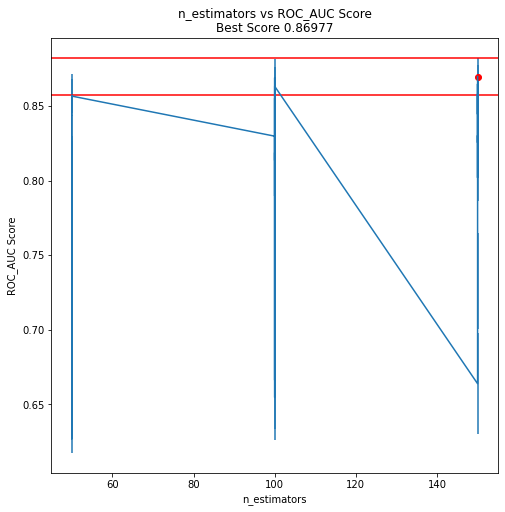

In [124]:
GridSearch_table_plot(ab_gridcv, "n_estimators", negative=False)

best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.3, 'n_estimators': 150}
best ROC_AUC score:      0.86977 (+/-0.01258)


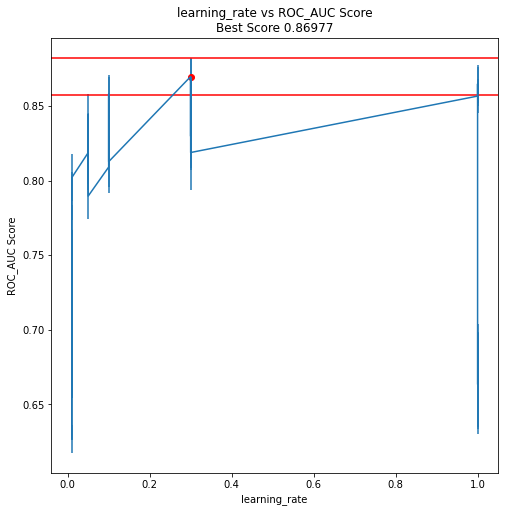

In [125]:
GridSearch_table_plot(ab_gridcv, "learning_rate", negative=False)

best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.3, 'n_estimators': 150}
best ROC_AUC score:      0.86977 (+/-0.01258)


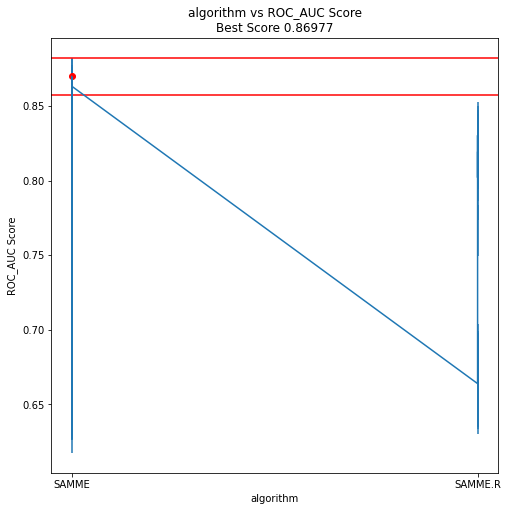

In [126]:
GridSearch_table_plot(ab_gridcv, "algorithm", negative=False)

### 8. Gradient Boosting

In [127]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier(random_state=0)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
model_stats(y_test,y_pred)

[[ 76   0   0  30   6   1   0]
 [  0  15   0   5   1   0   0]
 [  1   0 114   8   0   0   0]
 [ 35   2   2 150   4   1   4]
 [  3   0   0  16  27   0   0]
 [  0   0   0   1   0  20   0]
 [  0   0   0   4   0   0  57]]
Accuracy Score 0.7873070325900514
Classification report:               precision    recall  f1-score   support

           0       0.66      0.67      0.67       113
           1       0.88      0.71      0.79        21
           2       0.98      0.93      0.95       123
           3       0.70      0.76      0.73       198
           4       0.71      0.59      0.64        46
           5       0.91      0.95      0.93        21
           6       0.93      0.93      0.93        61

    accuracy                           0.79       583
   macro avg       0.83      0.79      0.81       583
weighted avg       0.79      0.79      0.79       583

F1 Score 0.7882200041330323


In [129]:
y_pred_proba = clf.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9569430201644161


### 8.A Gradient Grid Search

In [130]:
parameters = {
    "loss":["deviance", "exponential"],
    "learning_rate": [0.1, 0.2, 1],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.85, 0.9, 0.95, 1.0],
    "n_estimators":[10]
    }

In [131]:
gb = GradientBoostingClassifier()
gb_gridcv=GridSearchCV(estimator=gb,param_grid=parameters,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
gb_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 288 candidates, totalling 14400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done 1706 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 2881 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3488 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 5881 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 8322 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 10829 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 14385 out of 14400 | elapsed: 30.5min remaining:    1.9s
[Parallel(n_jobs=-1)]: Done 14400 out of 14400 | elapsed: 30.5min finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'criterion': ['friedman_mse', 'mae'],
                         'learning_rate': [0.1, 0.2, 1],
                         'loss': ['deviance', 'exponential'],
                         'max_depth': [3, 5, 8],
                         'max_features': ['log2', 'sqrt'], 'n_estimators': [10],
                         'subsample': [0.85, 0.9, 0.95, 1.0]},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [132]:
best_grid_gb=gb_gridcv.best_estimator_
y_pred=best_grid_gb.predict(X_test)
model_stats(y_test,y_pred)

[[ 65   0   0  43   5   0   0]
 [  0  10   0  11   0   0   0]
 [  1   0 114   8   0   0   0]
 [ 29   0   3 160   3   0   3]
 [  2   1   0  23  20   0   0]
 [  0   0   0   1   0  20   0]
 [  1   1   2   5   0   0  52]]
Accuracy Score 0.7564322469982847
Classification report:               precision    recall  f1-score   support

           0       0.66      0.58      0.62       113
           1       0.83      0.48      0.61        21
           2       0.96      0.93      0.94       123
           3       0.64      0.81      0.71       198
           4       0.71      0.43      0.54        46
           5       1.00      0.95      0.98        21
           6       0.95      0.85      0.90        61

    accuracy                           0.76       583
   macro avg       0.82      0.72      0.76       583
weighted avg       0.77      0.76      0.75       583

F1 Score 0.7536678113034861


In [133]:
f1_score_gb = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_gb)

F1 Score:  0.7536678113034861


In [134]:
y_pred_gb = best_grid_gb.predict_proba(X_test)
roc_score_gb = roc_auc_score(y_test,y_pred_gb, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_gb)

ROC AUC Score:  0.9456883418568872


In [135]:
cv_results = gb_gridcv.cv_results_
scores_gb_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_gb_grid.to_csv(r'gb_scores.csv', index =False)

### 8.B Evaluating the Gradient Boosting Grid Search Results

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


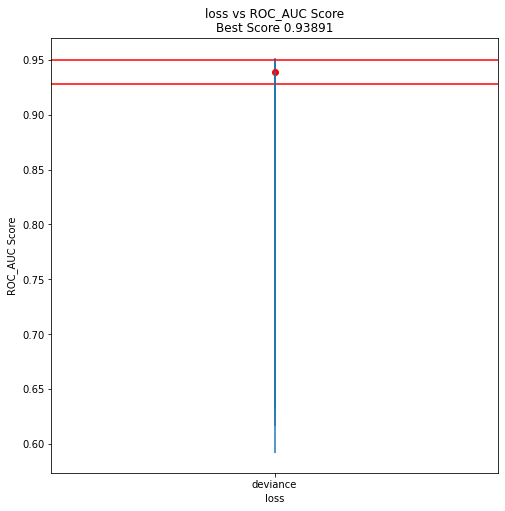

In [136]:
GridSearch_table_plot(gb_gridcv, "loss", negative=False)

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


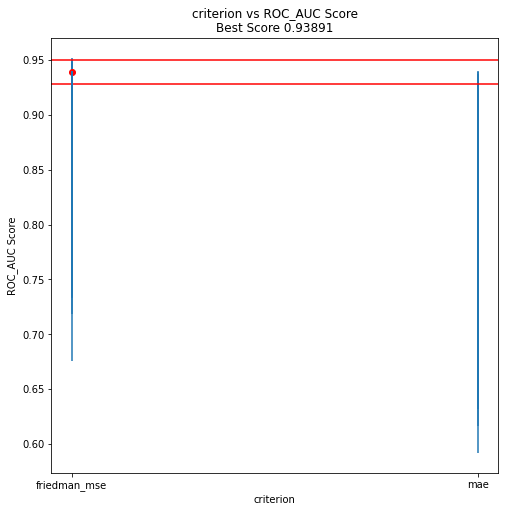

In [137]:
GridSearch_table_plot(gb_gridcv, "criterion", negative=False)

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


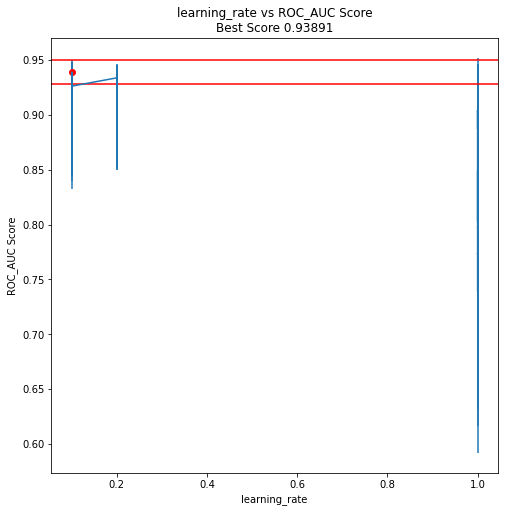

In [138]:
GridSearch_table_plot(gb_gridcv, "learning_rate", negative=False)

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


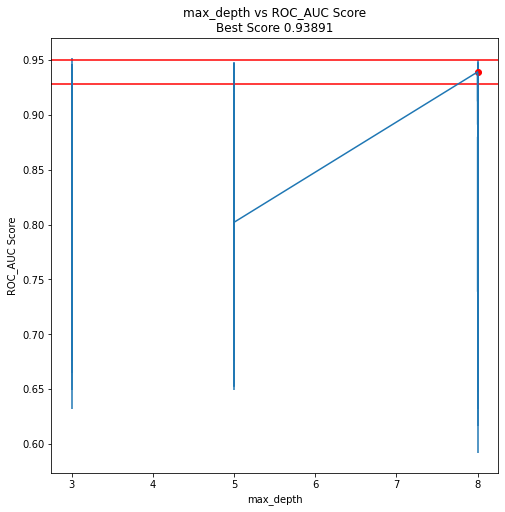

In [139]:
GridSearch_table_plot(gb_gridcv, "max_depth", negative=False)

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


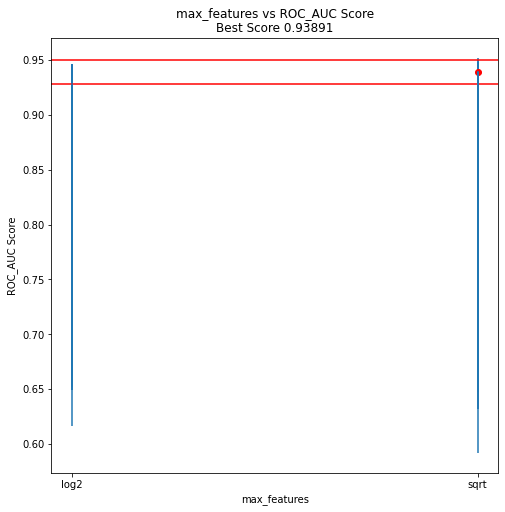

In [140]:
GridSearch_table_plot(gb_gridcv, "max_features", negative=False)

best parameters: {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 10, 'subsample': 1.0}
best ROC_AUC score:      0.93891 (+/-0.01068)


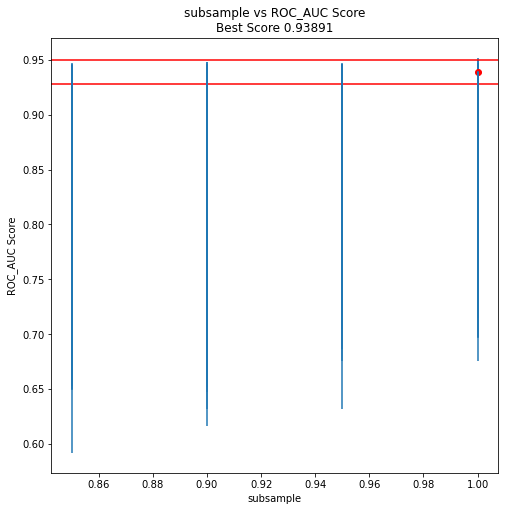

In [141]:
GridSearch_table_plot(gb_gridcv, "subsample", negative=False)

### 9. Linear Discriminant Analysis

In [142]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
model = LinearDiscriminantAnalysis(n_components = 6)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
model_stats(y_test, y_pred)

[[ 64   1   0  40   4   0   4]
 [  0   8   0  11   2   0   0]
 [  2   0 109   9   3   0   0]
 [ 43   3   4 121  17   1   9]
 [  4   0   0  13  27   0   2]
 [  0   0   0   0   0  21   0]
 [  2   1   0   4   0   0  54]]
Accuracy Score 0.692967409948542
Classification report:               precision    recall  f1-score   support

           0       0.56      0.57      0.56       113
           1       0.62      0.38      0.47        21
           2       0.96      0.89      0.92       123
           3       0.61      0.61      0.61       198
           4       0.51      0.59      0.55        46
           5       0.95      1.00      0.98        21
           6       0.78      0.89      0.83        61

    accuracy                           0.69       583
   macro avg       0.71      0.70      0.70       583
weighted avg       0.70      0.69      0.69       583

F1 Score 0.6933431450686278


In [144]:
y_pred_proba = model.predict_proba(X_test)
roc_score = roc_auc_score(y_test,y_pred_proba, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score)

ROC AUC Score:  0.9065546065352991


### 9.A LDA Grid Search

In [145]:
n_components = [2, 4, 6, 10, 15]
solver = ['svd', 'lsqr', 'eigen']
shrinkage =  [0.1, 0.3, 0.5, 0.8]
search_params = {'n_components': n_components,
                'shrinkage': shrinkage,
                 'solver' :solver
                }

In [146]:
ld = LinearDiscriminantAnalysis()
ld_gridcv=GridSearchCV(estimator=ld,param_grid=search_params,cv=rskf,n_jobs=-1,verbose=2, scoring = 'roc_auc_ovo_weighted')
ld_gridcv.fit(X_train,y_train)

Fitting 50 folds for each of 60 candidates, totalling 3000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 2636 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 3000 out of 3000 | elapsed:    8.9s finished


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=LinearDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'n_components': [2, 4, 6, 10, 15],
                         'shrinkage': [0.1, 0.3, 0.5, 0.8],
                         'solver': ['svd', 'lsqr', 'eigen']},
             scoring='roc_auc_ovo_weighted', verbose=2)

In [147]:
best_grid_ld=ld_gridcv.best_estimator_
y_pred=best_grid_ld.predict(X_test)
model_stats(y_test,y_pred)

[[ 65   1   1  38   5   0   3]
 [  0   7   0   9   5   0   0]
 [  0   0 109  11   3   0   0]
 [ 44   1   5 117  21   2   8]
 [  5   0   0  11  28   0   2]
 [  0   0   0   0   0  21   0]
 [  2   1   0   4   0   0  54]]
Accuracy Score 0.6878216123499142
Classification report:               precision    recall  f1-score   support

           0       0.56      0.58      0.57       113
           1       0.70      0.33      0.45        21
           2       0.95      0.89      0.92       123
           3       0.62      0.59      0.60       198
           4       0.45      0.61      0.52        46
           5       0.91      1.00      0.95        21
           6       0.81      0.89      0.84        61

    accuracy                           0.69       583
   macro avg       0.71      0.70      0.69       583
weighted avg       0.70      0.69      0.69       583

F1 Score 0.6879496323516433


In [148]:
f1_score_ld = f1_score(y_test,y_pred, average='weighted')
print("F1 Score: ", f1_score_ld)

F1 Score:  0.6879496323516433


In [149]:
y_pred_ld = best_grid_ld.predict_proba(X_test)
roc_score_ld = roc_auc_score(y_test,y_pred_ld, average= 'weighted', multi_class = 'ovo')
print("ROC AUC Score: " , roc_score_ld)

ROC AUC Score:  0.9049179836533169


In [150]:
cv_results = ld_gridcv.cv_results_
scores_ld_grid = pd.DataFrame(cv_results).sort_values(by='rank_test_score')
scores_ld_grid.to_csv(r'ld_scores.csv', index =False)

### 9.B Evaluating the Linear Discriminant Analysis Grid Search Results

best parameters: {'n_components': 2, 'shrinkage': 0.1, 'solver': 'lsqr'}
best ROC_AUC score:      0.91401 (+/-0.00978)


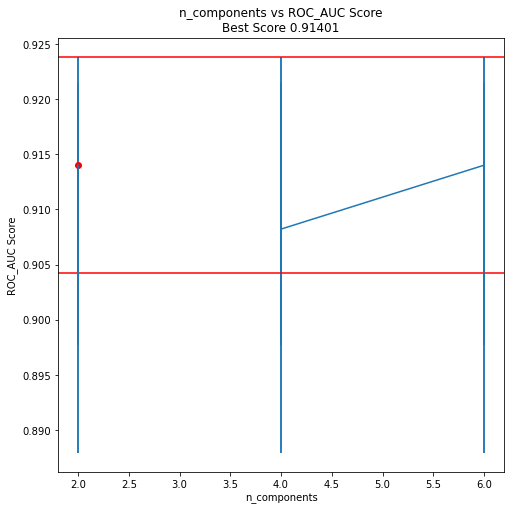

In [151]:
GridSearch_table_plot(ld_gridcv, "n_components", negative=False)

best parameters: {'n_components': 2, 'shrinkage': 0.1, 'solver': 'lsqr'}
best ROC_AUC score:      0.91401 (+/-0.00978)


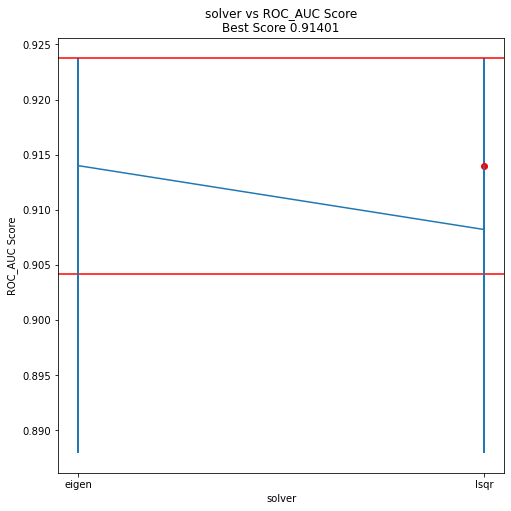

In [152]:
GridSearch_table_plot(ld_gridcv, "solver", negative=False)

best parameters: {'n_components': 2, 'shrinkage': 0.1, 'solver': 'lsqr'}
best ROC_AUC score:      0.91401 (+/-0.00978)


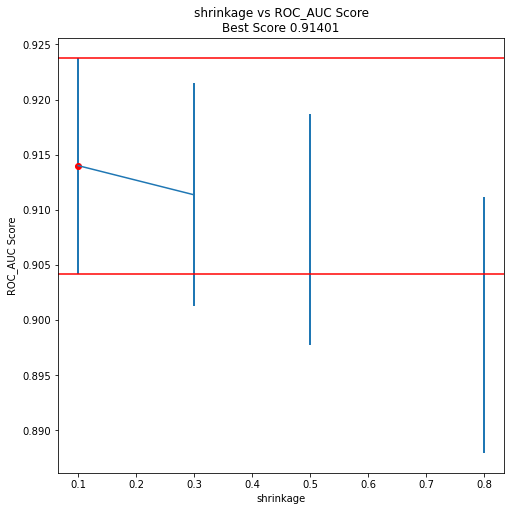

In [153]:
GridSearch_table_plot(ld_gridcv, "shrinkage", negative=False)

### Model Comparison


<table align="center" style="width:850px;border: 1px solid #ddd">
    <tr style="background-color:#3277a8;color:white;font-size:12px">
        <th style="width:50px;border: 1px solid #ddd;text-align:center">No.</th>
        <th style="width:300px;border: 1px solid #ddd;text-align:center">Model Name</th>
        <th style="width:150px;border: 1px solid #ddd;text-align:center">ROC AUC Weighted</th>
        <th style="width:150px;border: 1px solid #ddd;text-align:center">F1 Weghted</th>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">1.</td>
        <td style="border: 1px solid #ddd;text-align:left">Random Forest</td>
        <td style="border: 1px solid #ddd;text-align:center">0.929</td>
        <td style="border: 1px solid #ddd;text-align:center">0.739</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">2.</td>
        <td style="border: 1px solid #ddd;text-align:left">Random Forest with Randomized Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.950</td>
        <td style="border: 1px solid #ddd;text-align:center">0.752</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">3.</td>
        <td style="border: 1px solid #ddd;text-align:left">Random Forest with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.950</td>
        <td style="border: 1px solid #ddd;text-align:center">0.757</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">4.</td>
        <td style="border: 1px solid #ddd;text-align:left">Logistic Regression</td>
        <td style="border: 1px solid #ddd;text-align:center">0.901</td>
        <td style="border: 1px solid #ddd;text-align:center">0.697</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">5.</td>
        <td style="border: 1px solid #ddd;text-align:left">Logistic Regression with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.918</td>
        <td style="border: 1px solid #ddd;text-align:center">0.710</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">6.</td>
        <td style="border: 1px solid #ddd;text-align:left">SVM</td>
        <td style="border: 1px solid #ddd;text-align:center">NaN</td>
        <td style="border: 1px solid #ddd;text-align:center">0.737</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">7.</td>
        <td style="border: 1px solid #ddd;text-align:left">SVM with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">NaN</td>
        <td style="border: 1px solid #ddd;text-align:center">0.762</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">8.</td>
        <td style="border: 1px solid #ddd;text-align:left">XG Boost</td>
        <td style="border: 1px solid #ddd;text-align:center">0.958</td>
        <td style="border: 1px solid #ddd;text-align:center">0.807</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">9.</td>
        <td style="border: 1px solid #ddd;text-align:left">XG Boost with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.954</td>
        <td style="border: 1px solid #ddd;text-align:center">0.779</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">10.</td>
        <td style="border: 1px solid #ddd;text-align:left">Naive Bayes</td>
        <td style="border: 1px solid #ddd;text-align:center">0.901</td>
        <td style="border: 1px solid #ddd;text-align:center">0.613</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">11.</td>
        <td style="border: 1px solid #ddd;text-align:left">Naive Bayes with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.901</td>
        <td style="border: 1px solid #ddd;text-align:center">0.613</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">12.</td>
        <td style="border: 1px solid #ddd;text-align:left">K Nearest Neighbour</td>
        <td style="border: 1px solid #ddd;text-align:center">0.922</td>
        <td style="border: 1px solid #ddd;text-align:center">0.727</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">13.</td>
        <td style="border: 1px solid #ddd;text-align:left">K Nearest Neighbour with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.934</td>
        <td style="border: 1px solid #ddd;text-align:center">0.742</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">14.</td>
        <td style="border: 1px solid #ddd;text-align:left">ADA Boost</td>
        <td style="border: 1px solid #ddd;text-align:center">0.648</td>
        <td style="border: 1px solid #ddd;text-align:center">0.409</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">15.</td>
        <td style="border: 1px solid #ddd;text-align:left">ADA Boost with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.869</td>
        <td style="border: 1px solid #ddd;text-align:center">0.558</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">16.</td>
        <td style="border: 1px solid #ddd;text-align:left">Gradient Boost</td>
        <td style="border: 1px solid #ddd;text-align:center">0.956</td>
        <td style="border: 1px solid #ddd;text-align:center">0.788</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">17.</td>
        <td style="border: 1px solid #ddd;text-align:left">Gradient Boost with Grid Search CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.945</td>
        <td style="border: 1px solid #ddd;text-align:center">0.753</td>
    </tr>
     <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">18.</td>
        <td style="border: 1px solid #ddd;text-align:left">Linear Discriminant Analysis</td>
        <td style="border: 1px solid #ddd;text-align:center">0.906</td>
        <td style="border: 1px solid #ddd;text-align:center">0.693</td>
    </tr>
    <tr style="font-size:12px">
        <td style="border: 1px solid #ddd;text-align:center">19.</td>
        <td style="border: 1px solid #ddd;text-align:left">Linear Discriminant Analysis with Grid Saerch CV</td>
        <td style="border: 1px solid #ddd;text-align:center">0.904</td>
        <td style="border: 1px solid #ddd;text-align:center">0.687</td>
    </tr>

Form the above table we can say that XG Boost, Gradient Boost and Random Forest worked well and gave good results. The reason behind why other models didn't perform well was the data pre processing and Feature selection.

Especially for algorithms like Logistic Regression and SVM, normally distributed data would have given better results. Never the less, this was a analysis experiment and changes can be done to improve the results.

### Summary of Analysis

#### How do you prepare your dataset ?

a. Firstly, I divided the dependent and independent features from the given dataset. Then I assigned the respective column name to each independent variable as they were not having proper labels. This information was taken from the data source as it had all the column names of every independent variable.

b. Next step was to deal with the categorical variables which were present in the dependent feature ("target"). So, I checked the unique classes in the feature along with their value counts. With the help of Label Encoder technique, I assigned the respective integer value to each class (in total there were 7 classes so assigning the unique value from 0-6 to each unique class). This step is important as we have to pass numerical values to our model as it would not train with respect to categorical values.

c. Next, I created the X variable which holds the independent features and y variable that holds the target variable which depends on the independent variable.

d. Then with the help of train test split, I split the data in the 70:30 ratio between training and test sets. 

e. I used Standard Scalar for scaling the independent feature from the training and testing sets. The use of scaling is important to form parity between the values when any feature has magnitude and units so that it can be easy to adapt for the machine learning algorithm.

f. Lastly, I used Repeated stratified K fold method with 5 splits and 10 repeats. The Repeats Stratified K-Fold n times with different randomization in each repetition. The StratifiedKFold preserves the class ratios (approximately 1 / 10) in both train and test dataset. RepeatedStratifiedKFold is used to repeat Stratified K-Fold n times with different randomization in each repetition. This would solve the problem of imbalance dataset for this problem.

Note: I have not done feature selection for these projects as the primary goal of the project is to get the base models and store the results for analysis in order to get the solution over the similar industrial usecases.

#### What are the good classification performance measures for your dataset ? Why?

a. Firstly for a classification problem statement, we focus on any of the following metrics to measure the performance depending on whether the dataset is the balanced or imbalanced.

- Confusion matrix
- Recall
- Precision
- ROC AUC Score
- Accuracy of the model
- F1 score

b. There is no free lunch that would confirm that using any of the above can be the only metric that is to look after for performance measure. It completely depends on the problem statement and the balance of the dataset.

c. In this dataset, when I checked the counts of the 7 unique classes, the dataset looked imbalanced as the values were not at all in proportion. Following are counts of each class:

- Other_Faults:    673
- Bumps:           402
- K_Scratch:      391
- Z_Scratch:       190
- Pastry:          158
- Stains:           72
- Dirtiness:        55

d. There are methods to handle the imbalanced datasets by using techniques like upsampling and downsampling but as it was not the primary focus of the project I didn't use those techniques to solve the problem.

e. Accuracy of the model can be considered as good classification performance measure if the dataset seemed balanced but in this case, as the dataset was imbalanced I mainly focused on Precision, Recall and F1 score as good classification performance measure. 

f. ROC_AUC curve can be used to set the threshold for considering the classification but it is mostly used in binary classification. But we can extend it to multiclass classification problems by using the One vs All technique or One Vs One technique. 

g. I used the scoring metric as roc_auc_ovo_weighted for grid search. The multi-class One-vs-One scheme compares every unique pairwise combination of classes. Weighted because it calculate metrics for each label, and find their average, weighted by support (the number of true instances for each label).

h. The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve.

i. With reference to False Positives and False Negatives in confusion matrix of each model I decided that both are equally important in case of this problem statement as we need to classify the type of fault of steel plates. 

j. So, F1 weighted average score and ROC AUC weighted scores are the best estimators of the models here according to my knowledge. 

### What are the important parameters that should be tuned in each algorithm?

In this project I used in total 8 different machine learning algorithms and each of them having certain set of parameter that are important for tuning the model.

b. Tuning of the models completely depend on how we choose the hyper parameters as there are variety of values that can be given to a single parameter in an algorithm.

c. I list the algoithm and its paramaters that I felt are important and used in model tuning as follows:

- Random Forest Classifier:
    - n_estimators
    - max_features
    - min_samples_split
    
- Logistic Regression:
    - Cs
    - penalty
    - multi_class
    - solver
    
- Support vector machine
    - C
    - kernel
    - gamma
    - decision_function_shape
    
- XGBoost
    - max_depth
    - min_child_weight
    - gamma
    - objective
    - num_class
    - reg_alpha
    
- Naive Bayes
    -var_smoothing
    
- KNN
    - n_neighbours
    - weights
    - metrics
    
- ADA Boost
    - n_estimators
    - learning rate
    - algorithm
    
- Gradient Boost
    - loss"
    - learning_rate"
    - min_samples_split
    - min_samples_leaf
    - max_depth
    - max_features
    - criterion"
    - subsample
    - n_estimators
    
- Linear Discriminant Analysis
    - solver
    - n_components
    - shrinkage
    
    
- <b>Note:</b>
I have taken all the above paramaters of each algorithm too tune the model out of the available parameters in each algorithm. 

By understanding each parameter of the respective algorithm by following the documentation and why exactly those parameters are needed. Also, I got to know when to use which parameter for example here in this dataset as it is a multi classification problem there are certain parameters that dosen't support for such scenario. 

###  How can you statistically prove that your results are valid?

a. The validility of the result can be checked on the basis of performance metrics of the model. 

b. If you see that after the model is fitted on the training data I used the test set to predict and then validate the results. Because, the test set was not been the part of training we can get to know whether our model is generalised or not. 

c. If the values of precision, recall and F1 scores are low that means our model has misclassfied the testing data by a huge margin and vise versa. In this case as mentioned earlier feature selection can be done along with transforming data normally.

### Conclusion

- Bagging and Boosting alogorithm performed well amongst the lot but still there is a margin to improve the performance.
- Finally, I can say that this project was quite challenging as working on a multiclass classification problem containing 7 unique classes with imbalanced sets made it tough. 
- The model tuning and researching on parameters by understanding their use was the key highlight of this project. Now further scope of the project would be to use tools like Tableau or Power BI in order to analyse the grid search results given by each algorithm. This way we can find important insight for similar usecases.